### Import the necessay libraries

In [50]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 75)
import time
import datetime
import traceback
import calendar
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score,StratifiedKFold,train_test_split
from sklearn.metrics import accuracy_score,auc,f1_score,confusion_matrix,roc_curve,log_loss

import lightgbm as lgbm
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder



from helper_func import *


from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
pyo.init_notebook_mode()

### Read the data and impute the data

In [51]:
data = pd.read_csv('home_insurance.csv')
data.head()

,QUOTE_DATE,COVER_START,CLAIM3YEARS,P1_EMP_STATUS,P1_PT_EMP_STATUS,BUS_USE,CLERICAL,AD_BUILDINGS,RISK_RATED_AREA_B,SUM_INSURED_BUILDINGS,NCD_GRANTED_YEARS_B,AD_CONTENTS,RISK_RATED_AREA_C,SUM_INSURED_CONTENTS,NCD_GRANTED_YEARS_C,CONTENTS_COVER,BUILDINGS_COVER,SPEC_SUM_INSURED,SPEC_ITEM_PREM,UNSPEC_HRP_PREM,P1_DOB,P1_MAR_STATUS,P1_POLICY_REFUSED,P1_SEX,APPR_ALARM,APPR_LOCKS,BEDROOMS,ROOF_CONSTRUCTION,WALL_CONSTRUCTION,FLOODING,LISTED,MAX_DAYS_UNOCC,NEIGH_WATCH,OCC_STATUS,OWNERSHIP_TYPE,PAYING_GUESTS,PROP_TYPE,SAFE_INSTALLED,SEC_DISC_REQ,SUBSIDENCE,YEARBUILT,CAMPAIGN_DESC,PAYMENT_METHOD,PAYMENT_FREQUENCY,LEGAL_ADDON_PRE_REN,LEGAL_ADDON_POST_REN,HOME_EM_ADDON_PRE_REN,HOME_EM_ADDON_POST_REN,GARDEN_ADDON_PRE_REN,GARDEN_ADDON_POST_REN,KEYCARE_ADDON_PRE_REN,KEYCARE_ADDON_POST_REN,HP1_ADDON_PRE_REN,HP1_ADDON_POST_REN,HP2_ADDON_PRE_REN,HP2_ADDON_POST_REN,HP3_ADDON_PRE_REN,HP3_ADDON_POST_REN,MTA_FLAG,MTA_FAP,MTA_APRP,MTA_DATE,LAST_ANN_PREM_GROSS,POL_STATUS,i,Police
0,11/22/2007,22/11/2007,N,R,NaN,N,NaN,Y,19.0,1000000.0,7.0,Y,6.0,50000.0,7.0,Y,Y,7500.0,44.42,12.45,15/06/1939,O,N,M,N,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,10.0,Y,Y,N,1960.0,NaN,PureDD,NaN,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,NaN,NaN,NaN,274.81,Lapsed,1,P000001
1,11/22/2007,01/01/2008,N,E,NaN,Y,N,Y,25.0,1000000.0,6.0,Y,9.0,50000.0,7.0,Y,Y,0.0,0.00,24.60,20/05/1970,M,N,M,N,N,3.0,11.0,15.0,Y,3.0,0.0,N,PH,3.0,0.0,2.0,N,N,N,1960.0,NaN,PureDD,NaN,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,308.83,-9.27,NaN,308.83,Live,2,P000002
2,11/23/2007,23/11/2007,N,E,NaN,N,NaN,N,NaN,0.0,0.0,Y,12.0,50000.0,7.0,N,Y,0.0,0.00,0.00,10/06/1947,S,N,M,Y,Y,2.0,11.0,15.0,Y,3.0,0.0,Y,PH,8.0,0.0,9.0,N,Y,N,1946.0,NaN,PureDD,NaN,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,52.65,52.65,03/11/2010,52.65,Live,3,P000003
3,11/23/2007,12/12/2007,N,R,NaN,N,NaN,N,NaN,0.0,0.0,Y,14.0,50000.0,7.0,N,Y,0.0,0.00,0.00,16/12/1925,W,N,F,N,Y,2.0,11.0,15.0,Y,3.0,0.0,N,PH,18.0,0.0,19.0,N,Y,N,1870.0,NaN,NonDD,NaN,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,NaN,NaN,NaN,54.23,Live,4,P000004
4,11/22/2007,15/12/2007,N,R,NaN,N,NaN,Y,5.0,1000000.0,7.0,Y,10.0,50000.0,7.0,Y,Y,0.0,0.00,19.82,11/02/1936,M,N,M,Y,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,1.0,N,Y,N,1960.0,NaN,DD-Other,NaN,Y,Y,N,N,Y,Y,N,N,N,N,N,N,N,N,N,NaN,NaN,NaN,244.58,Live,5,P000005


In [52]:
# Remove the unkown 
print(data['POL_STATUS'].value_counts(dropna=False))
data = data[(data.POL_STATUS != 'Unknown') &(~data.POL_STATUS.isna())]

Live         132160
NaN           67115
Lapsed        52534
Cancelled      4311
Unknown          16
Name: POL_STATUS, dtype: int64


In [53]:
# Remove the Campaign and i value as they have null value
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 189005 entries, 0 to 256135
Data columns (total 66 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   QUOTE_DATE              79137 non-null   object 
 1   COVER_START             189005 non-null  object 
 2   CLAIM3YEARS             189005 non-null  object 
 3   P1_EMP_STATUS           189005 non-null  object 
 4   P1_PT_EMP_STATUS        1782 non-null    object 
 5   BUS_USE                 189005 non-null  object 
 6   CLERICAL                2944 non-null    object 
 7   AD_BUILDINGS            189005 non-null  object 
 8   RISK_RATED_AREA_B       140865 non-null  float64
 9   SUM_INSURED_BUILDINGS   189005 non-null  float64
 10  NCD_GRANTED_YEARS_B     189005 non-null  float64
 11  AD_CONTENTS             189005 non-null  object 
 12  RISK_RATED_AREA_C       180274 non-null  float64
 13  SUM_INSURED_CONTENTS    189005 non-null  float64
 14  NCD_GRANTED_YEARS_C 

In [54]:
# Remove the Campaign and i value as they have null value
data.describe()

,RISK_RATED_AREA_B,SUM_INSURED_BUILDINGS,NCD_GRANTED_YEARS_B,RISK_RATED_AREA_C,SUM_INSURED_CONTENTS,NCD_GRANTED_YEARS_C,SPEC_SUM_INSURED,SPEC_ITEM_PREM,UNSPEC_HRP_PREM,BEDROOMS,ROOF_CONSTRUCTION,WALL_CONSTRUCTION,LISTED,MAX_DAYS_UNOCC,OWNERSHIP_TYPE,PAYING_GUESTS,PROP_TYPE,YEARBUILT,CAMPAIGN_DESC,PAYMENT_FREQUENCY,MTA_FAP,MTA_APRP,LAST_ANN_PREM_GROSS,i
count,140865.000000,189005.000000,189005.000000,180274.000000,189005.000000,189005.000000,189005.000000,189005.000000,189005.000000,189005.000000,189005.000000,189005.000000,189005.000000,189005.000000,189005.000000,189005.000000,189005.000000,189005.000000,0.0,80550.0,55375.000000,55375.000000,189005.000000,189005.000000
mean,10.273886,778138.144494,4.477167,9.055432,47836.036084,5.497336,329.493992,2.507021,5.653435,2.779710,11.020613,14.977974,2.995672,8.471517,7.646142,0.001095,10.230147,1944.993995,NaN,1.0,200.804959,90.577593,186.725297,127042.733102
std,8.449182,415499.802639,2.677508,7.624396,10706.789671,1.777474,1333.644371,10.666695,10.254379,0.801425,0.885433,0.870055,0.083711,15.213641,2.543348,0.033076,8.948981,28.903573,NaN,0.0,107.927949,121.963150,99.495998,75138.451571
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1749.000000,NaN,1.0,-1152.680000,-423.080000,-1152.680000,1.000000
25%,3.000000,1000000.000000,3.000000,3.000000,50000.000000,6.000000,0.000000,0.000000,0.000000,2.000000,11.000000,15.000000,3.000000,0.000000,8.000000,0.000000,2.000000,1920.000000,NaN,1.0,137.280000,0.000000,123.380000,63761.000000
50%,9.000000,1000000.000000,6.000000,7.000000,50000.000000,6.000000,0.000000,0.000000,0.000000,3.000000,11.000000,15.000000,3.000000,0.000000,8.000000,0.000000,10.000000,1946.000000,NaN,1.0,188.950000,0.000000,177.340000,127562.000000
75%,14.000000,1000000.000000,6.000000,13.000000,50000.000000,6.000000,0.000000,0.000000,12.450000,3.000000,11.000000,15.000000,3.000000,30.000000,8.000000,0.000000,18.000000,1960.000000,NaN,1.0,248.785000,180.815000,234.960000,192281.000000
max,98.000000,1000000.000000,9.000000,98.000000,100000.000000,9.000000,47500.000000,973.530000,162.610000,7.000000,99.000000,99.000000,5.000000,181.000000,18.000000,1.000000,53.000000,2000.000000,NaN,1.0,4631.860000,1449.240000,4631.860000,256136.000000


In [55]:
# Check the total unique value of Policy Number and i same as total count so remove the variable
data['Police'].nunique() , data['CAMPAIGN_DESC'].nunique() , data['i'].nunique()
#
data.drop(['Police','CAMPAIGN_DESC','i'],axis=1,inplace = True)

In [56]:
# impute the P1_PT_EMP_STATUS as lot of Null Value
data.loc[data['P1_PT_EMP_STATUS'].isna(),'P1_PT_EMP_STATUS'] = "Nil"

In [57]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Bar(x=data['POL_STATUS'].value_counts(normalize = True).reset_index()['index'], y=data['POL_STATUS'].value_counts(normalize = True).reset_index()['POL_STATUS']),
    row=1, col=1
)

fig.add_trace(
    go.Bar(x=data['POL_STATUS'].value_counts().reset_index()['index'], y=data['POL_STATUS'].value_counts().reset_index()['POL_STATUS']),
    row=1, col=2
)

fig.update_layout(height=600, width=1200, title_text="Plot for policy status")
fig.show()

In [58]:
#  After looking at the data removing the MTA_DATE,MTA_APRP,CLERICAL
data.drop(['CLERICAL','MTA_APRP','MTA_DATE'],axis =1 ,inplace =True)

# Impute the MTA_FAP
data.loc[data.MTA_FAP.isna(),'MTA_FAP'] = 0

# Impute the payment frequecy 
data.loc[data.PAYMENT_FREQUENCY.isna(),'PAYMENT_FREQUENCY'] = "unknown"

In [59]:
# fig = make_subplots(rows=1, cols=2)
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data["RISK_RATED_AREA_B"],name="RISK RATED AREA B"),
)

fig.add_trace(
    go.Histogram(x=data["RISK_RATED_AREA_C"],name="RISK RATED AREA C"),

)

fig.update_layout(height=600, width=1200,barmode='stack',title_text="Histogram of Risk_Rated")
fig.show()


# Given the histogram show that the RISK_RATED_AREA_C is heavly skewed hence using the median for imputation
data.loc[data.RISK_RATED_AREA_B.isnull(),'RISK_RATED_AREA_B'] = data.RISK_RATED_AREA_B.median()
data.loc[data.RISK_RATED_AREA_B.isnull(),'RISK_RATED_AREA_C'] = data.RISK_RATED_AREA_B.median()
# Both follow nearly the same distribution so keeping one variable would be better than keeping both. for now keeping both of them in the mix


### Creating the Target variable 

In [60]:
# Creating a new variables (binary) whether the policy has lapsed or not
data['islapsed'] = 0
data.loc[data.POL_STATUS == 'Lapsed','islapsed'] = 1

### Looking into the Professional Status

In [61]:
d = data[['P1_EMP_STATUS','islapsed']].value_counts().reset_index()
d['type'] = 'abs'
d_p = data.groupby(['P1_EMP_STATUS','islapsed'])['POL_STATUS'].count()
d_p_ = d_p.groupby(['P1_EMP_STATUS']).sum()
d_p = d_p.div(d_p_, level='P1_EMP_STATUS') * 100
d_p = d_p.reset_index()
d_p['type'] = "percent"

fig = make_subplots(specs=[[{"secondary_y": True}]])

colors = ["red", "green"]
# Add traces
fig.add_trace(
    go.Bar(name='0', x=[d[d.islapsed ==0]['P1_EMP_STATUS'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==0][0],marker_color = "blue"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='1', x=[d[d.islapsed ==1]['P1_EMP_STATUS'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==1][0],marker_color ="pink"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='0', x=[d_p[d_p.islapsed ==0]['P1_EMP_STATUS'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==0]['POL_STATUS'],marker_color = "green"),
    secondary_y=True,
)

fig.add_trace(
    go.Bar(name='1', x=[d_p[d_p.islapsed ==1]['P1_EMP_STATUS'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==1]['POL_STATUS'],marker_color = "maroon"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Professional status vs Lapsed Policies",
    barmode = 'stack'
)

# Set x-axis title
fig.update_xaxes(title_text="Professional Status")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Abs</b> yaxis title", secondary_y=False)
fig.update_yaxes(title_text="<b>Percentage</b> yaxis title", secondary_y=True)

fig.show()

# Most of the policies are bought by retired personnel
# Does not seem to have much preditive power as does not have a lot of variability

In [62]:
d = data[['RISK_RATED_AREA_B','islapsed']].value_counts().reset_index()
d['type'] = 'abs'
d_p = data.groupby(['RISK_RATED_AREA_B','islapsed'])['POL_STATUS'].count()
d_p_ = d_p.groupby(['RISK_RATED_AREA_B']).sum()
d_p = d_p.div(d_p_, level='RISK_RATED_AREA_B') * 100
d_p = d_p.reset_index()
d_p['type'] = "percent"

fig = make_subplots(specs=[[{"secondary_y": True}]])

colors = ["red", "green"]
# Add traces
fig.add_trace(
    go.Bar(name='0', x=[d[d.islapsed ==0]['RISK_RATED_AREA_B'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==0][0],marker_color = "blue"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='1', x=[d[d.islapsed ==1]['RISK_RATED_AREA_B'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==1][0],marker_color ="pink"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='0', x=[d_p[d_p.islapsed ==0]['RISK_RATED_AREA_B'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==0]['POL_STATUS'],marker_color = "green"),
    secondary_y=True,
)

fig.add_trace(
    go.Bar(name='1', x=[d_p[d_p.islapsed ==1]['RISK_RATED_AREA_B'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==1]['POL_STATUS'],marker_color = "maroon"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="RISK_RATED_AREA_B vs Lapsed Policies",
    barmode = 'stack'
)

# Set x-axis title
fig.update_xaxes(title_text="Geographical Classification of Risk - Building")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Abs</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Percentage</b>", secondary_y=True)

fig.show()

# Majority of the policies belong to Risked Rated Area 9 
# Does not seem to have much preditive power as does not have a lot of variability

In [63]:
d = data[['CLAIM3YEARS','islapsed']].value_counts().reset_index()
d['type'] = 'abs'
d_p = data.groupby(['CLAIM3YEARS','islapsed'])['POL_STATUS'].count()
d_p_ = d_p.groupby(['CLAIM3YEARS']).sum()
d_p = d_p.div(d_p_, level='CLAIM3YEARS') * 100
d_p = d_p.reset_index()
d_p['type'] = "percent"

fig = make_subplots(specs=[[{"secondary_y": True}]])

colors = ["red", "green"]
# Add traces
fig.add_trace(
    go.Bar(name='0', x=[d[d.islapsed ==0]['CLAIM3YEARS'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==0][0],marker_color = "blue"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='1', x=[d[d.islapsed ==1]['CLAIM3YEARS'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==1][0],marker_color ="pink"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='0', x=[d_p[d_p.islapsed ==0]['CLAIM3YEARS'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==0]['POL_STATUS'],marker_color = "green"),
    secondary_y=True,
)

fig.add_trace(
    go.Bar(name='1', x=[d_p[d_p.islapsed ==1]['CLAIM3YEARS'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==1]['POL_STATUS'],marker_color = "maroon"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="CLAIM3YEARS vs Lapsed Policies",
    barmode = 'stack'
)

# Set x-axis title
fig.update_xaxes(title_text="Whether Claimed in the last 3 years - Building")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Abs</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Percentage</b>", secondary_y=True)

fig.show()

# The Claim History does not show a lot of segregation 
# Does not seem to have much preditive power as does not have a lot of variability

In [64]:
# create the Age variable
data['Person_Age'] = (datetime.datetime.today() - pd.to_datetime(data['P1_DOB']))/365
data['Person_Age'] = data['Person_Age'].dt.days
# create Age of building
data['building_age'] = datetime.datetime.today().year - data['YEARBUILT']

In [65]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Histogram(x=data["Person_Age"],name="Person Age"),
    row =1,
    col =1
)

fig.add_trace(
    go.Histogram(x=data["building_age"],name="Age of the Building"),
    row =1,
    col =2
)

fig.update_layout(height=600, width=1200,title_text="Histogram of Risk_Rated")
fig.show()


In [66]:
d = data[['building_age','islapsed']].value_counts().reset_index()
d['type'] = 'abs'
d_p = data.groupby(['building_age','islapsed'])['POL_STATUS'].count()
d_p_ = d_p.groupby(['building_age']).sum()
d_p = d_p.div(d_p_, level='building_age') * 100
d_p = d_p.reset_index()
d_p['type'] = "percent"

fig = make_subplots(specs=[[{"secondary_y": True}]])

colors = ["red", "green"]
# Add traces
fig.add_trace(
    go.Bar(name='0', x=[d[d.islapsed ==0]['building_age'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==0][0],marker_color = "blue"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='1', x=[d[d.islapsed ==1]['building_age'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==1][0],marker_color ="pink"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='0', x=[d_p[d_p.islapsed ==0]['building_age'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==0]['POL_STATUS'],marker_color = "green"),
    secondary_y=True,
)

fig.add_trace(
    go.Bar(name='1', x=[d_p[d_p.islapsed ==1]['building_age'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==1]['POL_STATUS'],marker_color = "maroon"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="building_age vs Lapsed Policies",
    barmode = 'stack'
)

# Set x-axis title
fig.update_xaxes(title_text="Age of the building")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Abs</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Percentage</b>", secondary_y=True)

fig.show()

# The Age of the building does not have a lot of variability. mean either the area had the building constructed around the same time
# Seems to have variability would be a good a predictor

In [67]:
# Checking whether Coverage month has any seasonality and whether 
data['coverage_month'] = pd.to_datetime(data['COVER_START']).dt.month
data['coverage_month'] = data['coverage_month'].apply(lambda x: calendar.month_abbr[x])

In [68]:
d = data[['coverage_month','islapsed']].value_counts().reset_index()
d['type'] = 'abs'
d_p = data.groupby(['coverage_month','islapsed'])['POL_STATUS'].count()
d_p_ = d_p.groupby(['coverage_month']).sum()
d_p = d_p.div(d_p_, level='coverage_month') * 100
d_p = d_p.reset_index()
d_p['type'] = "percent"

fig = make_subplots(specs=[[{"secondary_y": True}]])

colors = ["red", "green"]
# Add traces
fig.add_trace(
    go.Bar(name='0', x=[d[d.islapsed ==0]['coverage_month'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==0][0],marker_color = "blue"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='1', x=[d[d.islapsed ==1]['coverage_month'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==1][0],marker_color ="pink"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='0', x=[d_p[d_p.islapsed ==0]['coverage_month'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==0]['POL_STATUS'],marker_color = "green"),
    secondary_y=True,
)

fig.add_trace(
    go.Bar(name='1', x=[d_p[d_p.islapsed ==1]['coverage_month'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==1]['POL_STATUS'],marker_color = "maroon"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="coverage_month vs Lapsed Policies",
    barmode = 'stack'
)

# Set x-axis title
fig.update_xaxes(title_text="coverage_month of the Policies")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Abs</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Percentage</b>", secondary_y=True)

fig.show()

# The Age of the building does not have a lot of variability. mean either the area had the building constructed around the same time
# Seems to have variability would be a good a predictor

In [69]:
# Checking whether Quote month has any seasonality and whether 
data['Quote_month'] = pd.to_datetime(data['QUOTE_DATE']).dt.month
data['Quote_month'].fillna(-9,inplace = True)

In [70]:
d = data[['Quote_month','islapsed']].value_counts().reset_index()
d['type'] = 'abs'
d_p = data.groupby(['Quote_month','islapsed'])['POL_STATUS'].count()
d_p_ = d_p.groupby(['Quote_month']).sum()
d_p = d_p.div(d_p_, level='Quote_month') * 100
d_p = d_p.reset_index()
d_p['type'] = "percent"

fig = make_subplots(specs=[[{"secondary_y": True}]])

colors = ["red", "green"]
# Add traces
fig.add_trace(
    go.Bar(name='0', x=[d[d.islapsed ==0]['Quote_month'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==0][0],marker_color = "blue"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='1', x=[d[d.islapsed ==1]['Quote_month'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==1][0],marker_color ="pink"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='0', x=[d_p[d_p.islapsed ==0]['Quote_month'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==0]['POL_STATUS'],marker_color = "green"),
    secondary_y=True,
)

fig.add_trace(
    go.Bar(name='1', x=[d_p[d_p.islapsed ==1]['Quote_month'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==1]['POL_STATUS'],marker_color = "maroon"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Quote_month vs Lapsed Policies",
    barmode = 'stack'
)

# Set x-axis title
fig.update_xaxes(title_text="Quote_month of the Policies")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Abs</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Percentage</b>", secondary_y=True)

fig.show()

# So we find that if we have the information of when the quote was presented we find a higher rate of Lapsed Policies
# Seems to have variability would be a good a predictor

In [71]:
# Create time between quote to start of cover
# Not doing as not filled adequately and the variables seems to be sketchy

In [72]:
# check the impact of No Claim Bonus on the Lapsed and no lapsed Policies

d = data[['NCD_GRANTED_YEARS_B','islapsed']].value_counts().reset_index()
d['type'] = 'abs'
d_p = data.groupby(['NCD_GRANTED_YEARS_B','islapsed'])['POL_STATUS'].count()
d_p_ = d_p.groupby(['NCD_GRANTED_YEARS_B']).sum()
d_p = d_p.div(d_p_, level='NCD_GRANTED_YEARS_B') * 100
d_p = d_p.reset_index()
d_p['type'] = "percent"

fig = make_subplots(specs=[[{"secondary_y": True}]])

colors = ["red", "green"]
# Add traces
fig.add_trace(
    go.Bar(name='0', x=[d[d.islapsed ==0]['NCD_GRANTED_YEARS_B'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==0][0],marker_color = "blue"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='1', x=[d[d.islapsed ==1]['NCD_GRANTED_YEARS_B'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==1][0],marker_color ="pink"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='0', x=[d_p[d_p.islapsed ==0]['NCD_GRANTED_YEARS_B'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==0]['POL_STATUS'],marker_color = "green"),
    secondary_y=True,
)

fig.add_trace(
    go.Bar(name='1', x=[d_p[d_p.islapsed ==1]['NCD_GRANTED_YEARS_B'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==1]['POL_STATUS'],marker_color = "maroon"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="NCD_GRANTED_YEARS_B vs Lapsed Policies",
    barmode = 'stack'
)

# Set x-axis title
fig.update_xaxes(title_text="NCD_GRANTED_YEARS_B of the Policies")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Abs</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Percentage</b>", secondary_y=True)

fig.show()

# NCD has an inverse correlation between 
# Seems to have variability would be a good a predictor

In [48]:
# check the impact of No Claim Bonus on the Lapsed and no lapsed Policies

d = data[['NCD_GRANTED_YEARS_C','islapsed']].value_counts().reset_index()
d['type'] = 'abs'
d_p = data.groupby(['NCD_GRANTED_YEARS_C','islapsed'])['POL_STATUS'].count()
d_p_ = d_p.groupby(['NCD_GRANTED_YEARS_C']).sum()
d_p = d_p.div(d_p_, level='NCD_GRANTED_YEARS_C') * 100
d_p = d_p.reset_index()
d_p['type'] = "percent"

fig = make_subplots(specs=[[{"secondary_y": True}]])

colors = ["red", "green"]
# Add traces
fig.add_trace(
    go.Bar(name='0', x=[d[d.islapsed ==0]['NCD_GRANTED_YEARS_C'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==0][0],marker_color = "blue"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='1', x=[d[d.islapsed ==1]['NCD_GRANTED_YEARS_C'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==1][0],marker_color ="pink"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='0', x=[d_p[d_p.islapsed ==0]['NCD_GRANTED_YEARS_C'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==0]['POL_STATUS'],marker_color = "green"),
    secondary_y=True,
)

fig.add_trace(
    go.Bar(name='1', x=[d_p[d_p.islapsed ==1]['NCD_GRANTED_YEARS_C'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==1]['POL_STATUS'],marker_color = "maroon"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="NCD_GRANTED_YEARS_B vs Lapsed Policies",
    barmode = 'stack'
)

# Set x-axis title
fig.update_xaxes(title_text="NCD_GRANTED_YEARS_B of the Policies")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Abs</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Percentage</b>", secondary_y=True)

fig.show()

# NCD has an inverse correlation between 
# Seems to have variability would be a good a predictor

In [74]:
d = data[['PAYMENT_METHOD','islapsed']].value_counts().reset_index()
d['type'] = 'abs'
d_p = data.groupby(['PAYMENT_METHOD','islapsed'])['POL_STATUS'].count()
d_p_ = d_p.groupby(['PAYMENT_METHOD']).sum()
d_p = d_p.div(d_p_, level='PAYMENT_METHOD') * 100
d_p = d_p.reset_index()
d_p['type'] = "percent"

fig = make_subplots(specs=[[{"secondary_y": True}]])

colors = ["red", "green"]
# Add traces
fig.add_trace(
    go.Bar(name='0', x=[d[d.islapsed ==0]['PAYMENT_METHOD'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==0][0],marker_color = "blue"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='1', x=[d[d.islapsed ==1]['PAYMENT_METHOD'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==1][0],marker_color ="pink"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='0', x=[d_p[d_p.islapsed ==0]['PAYMENT_METHOD'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==0]['POL_STATUS'],marker_color = "green"),
    secondary_y=True,
)

fig.add_trace(
    go.Bar(name='1', x=[d_p[d_p.islapsed ==1]['PAYMENT_METHOD'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==1]['POL_STATUS'],marker_color = "maroon"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="PAYMENT METHOD vs Lapsed Policies",
    barmode = 'stack'
)

# Set x-axis title
fig.update_xaxes(title_text="PAYMENT METHOD")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Abs</b> yaxis title", secondary_y=False)
fig.update_yaxes(title_text="<b>Percentage</b> yaxis title", secondary_y=True)

fig.show()

# Most of the policies are bought by retired personnel
# Does not seem to have much preditive power as does not have a lot of variability

In [103]:
d = data[['P1_MAR_STATUS','islapsed']].value_counts().reset_index()
d['type'] = 'abs'
d_p = data.groupby(['P1_MAR_STATUS','islapsed'])['POL_STATUS'].count()
d_p_ = d_p.groupby(['P1_MAR_STATUS']).sum()
d_p = d_p.div(d_p_, level='P1_MAR_STATUS') * 100
d_p = d_p.reset_index()
d_p['type'] = "percent"

fig = make_subplots(specs=[[{"secondary_y": True}]])

colors = ["red", "green"]
# Add traces
fig.add_trace(
    go.Bar(name='0', x=[d[d.islapsed ==0]['P1_MAR_STATUS'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==0][0],marker_color = "blue"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='1', x=[d[d.islapsed ==1]['P1_MAR_STATUS'],d[d.islapsed ==0]['type']], y=d[d.islapsed ==1][0],marker_color ="pink"),
    secondary_y=False,
)

fig.add_trace(
    go.Bar(name='0', x=[d_p[d_p.islapsed ==0]['P1_MAR_STATUS'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==0]['POL_STATUS'],marker_color = "green"),
    secondary_y=True,
)

fig.add_trace(
    go.Bar(name='1', x=[d_p[d_p.islapsed ==1]['P1_MAR_STATUS'],d_p[d_p.islapsed ==0]['type']], y=d_p[d_p.islapsed ==1]['POL_STATUS'],marker_color = "maroon"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="P1 MAR STATUS vs Lapsed Policies",
    barmode = 'stack'
)

# Set x-axis title
fig.update_xaxes(title_text="P1 MAR STATUS")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Abs</b> yaxis title", secondary_y=False)
fig.update_yaxes(title_text="<b>Percentage</b> yaxis title", secondary_y=True)

fig.show()

# Most of the policies are bought by retired personnel
# Does not seem to have much preditive power as does not have a lot of variability

### Creating Features which might be useful

In [75]:
# Creating Total Insured Value variable
def total_protection(row):
    n = 0
    if row['SAFE_INSTALLED'] == "Y":
        n +=1
    if row['APPR_ALARM'] == "Y":
        n+=1
    if row['APPR_LOCKS'] == "Y":
        n +=1
    return n
        
    
data['TIV'] = data['SUM_INSURED_BUILDINGS'] + data['SUM_INSURED_CONTENTS'] + data['SPEC_SUM_INSURED']
data['Total_Protection'] = data.apply(total_protection,axis =1)

In [76]:
# Correct some of the features to Categories even though encoded with numbers
cols = ['RISK_RATED_AREA_B','RISK_RATED_AREA_C','ROOF_CONSTRUCTION','WALL_CONSTRUCTION','LISTED','OWNERSHIP_TYPE','PROP_TYPE','Quote_month']
for col in cols:
    data[col] = data[col].astype('category')

In [77]:
# plot the correlation funxtion 
corr = data.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

,SUM_INSURED_BUILDINGS,NCD_GRANTED_YEARS_B,SUM_INSURED_CONTENTS,NCD_GRANTED_YEARS_C,SPEC_SUM_INSURED,SPEC_ITEM_PREM,UNSPEC_HRP_PREM,BEDROOMS,MAX_DAYS_UNOCC,PAYING_GUESTS,YEARBUILT,MTA_FAP,LAST_ANN_PREM_GROSS,islapsed,Person_Age,building_age,TIV,Total_Protection
SUM_INSURED_BUILDINGS,1.00,0.89,-0.10,-0.08,0.03,0.02,0.04,0.35,0.08,0.01,-0.06,0.19,0.57,0.12,-0.02,0.06,1.00,0.10
NCD_GRANTED_YEARS_B,0.89,1.00,-0.10,0.13,0.02,0.01,-0.01,0.30,0.10,0.01,-0.05,0.14,0.45,0.11,-0.02,0.05,0.89,0.08
SUM_INSURED_CONTENTS,-0.10,-0.10,1.00,0.67,0.07,0.07,0.13,-0.02,-0.04,-0.02,0.04,0.03,0.07,-0.01,0.02,-0.04,-0.08,0.06
NCD_GRANTED_YEARS_C,-0.08,0.13,0.67,1.00,0.01,0.00,-0.02,-0.05,0.01,-0.02,0.04,-0.03,-0.08,-0.01,0.03,-0.04,-0.06,0.02
SPEC_SUM_INSURED,0.03,0.02,0.07,0.01,1.00,0.85,0.15,0.10,0.03,-0.00,0.01,0.15,0.23,0.05,-0.06,-0.01,0.04,0.13
SPEC_ITEM_PREM,0.02,0.01,0.07,0.00,0.85,1.00,0.16,0.09,0.03,0.00,0.01,0.15,0.23,0.05,-0.08,-0.01,0.03,0.11
UNSPEC_HRP_PREM,0.04,-0.01,0.13,-0.02,0.15,0.16,1.00,0.14,-0.05,-0.00,-0.01,0.14,0.35,0.01,-0.10,0.01,0.04,0.08
BEDROOMS,0.35,0.30,-0.02,-0.05,0.10,0.09,0.14,1.00,0.03,0.02,-0.05,0.18,0.51,0.08,-0.16,0.05,0.35,0.08
MAX_DAYS_UNOCC,0.08,0.10,-0.04,0.01,0.03,0.03,-0.05,0.03,1.00,0.01,0.02,-0.02,-0.07,0.15,-0.07,-0.02,0.08,-0.03
PAYING_GUESTS,0.01,0.01,-0.02,-0.02,-0.00,0.00,-0.00,0.02,0.01,1.00,-0.01,0.02,0.01,0.00,-0.01,0.01,0.01,-0.00


In [78]:
# We find that TIv is very highly correlated with SUM_INSURED_BUILDINGS hence droping the variable
data

,QUOTE_DATE,COVER_START,CLAIM3YEARS,P1_EMP_STATUS,P1_PT_EMP_STATUS,BUS_USE,AD_BUILDINGS,RISK_RATED_AREA_B,SUM_INSURED_BUILDINGS,NCD_GRANTED_YEARS_B,AD_CONTENTS,RISK_RATED_AREA_C,SUM_INSURED_CONTENTS,NCD_GRANTED_YEARS_C,CONTENTS_COVER,BUILDINGS_COVER,SPEC_SUM_INSURED,SPEC_ITEM_PREM,UNSPEC_HRP_PREM,P1_DOB,P1_MAR_STATUS,P1_POLICY_REFUSED,P1_SEX,APPR_ALARM,APPR_LOCKS,BEDROOMS,ROOF_CONSTRUCTION,WALL_CONSTRUCTION,FLOODING,LISTED,MAX_DAYS_UNOCC,NEIGH_WATCH,OCC_STATUS,OWNERSHIP_TYPE,PAYING_GUESTS,PROP_TYPE,SAFE_INSTALLED,SEC_DISC_REQ,SUBSIDENCE,YEARBUILT,PAYMENT_METHOD,PAYMENT_FREQUENCY,LEGAL_ADDON_PRE_REN,LEGAL_ADDON_POST_REN,HOME_EM_ADDON_PRE_REN,HOME_EM_ADDON_POST_REN,GARDEN_ADDON_PRE_REN,GARDEN_ADDON_POST_REN,KEYCARE_ADDON_PRE_REN,KEYCARE_ADDON_POST_REN,HP1_ADDON_PRE_REN,HP1_ADDON_POST_REN,HP2_ADDON_PRE_REN,HP2_ADDON_POST_REN,HP3_ADDON_PRE_REN,HP3_ADDON_POST_REN,MTA_FLAG,MTA_FAP,LAST_ANN_PREM_GROSS,POL_STATUS,islapsed,Person_Age,building_age,coverage_month,Quote_month,TIV,Total_Protection
0,11/22/2007,22/11/2007,N,R,Nil,N,Y,19.0,1000000.0,7.0,Y,6.0,50000.0,7.0,Y,Y,7500.0,44.42,12.45,15/06/1939,O,N,M,N,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,10.0,Y,Y,N,1960.0,PureDD,unknown,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,0.00,274.81,Lapsed,1,81,60.0,Nov,11.0,1057500.0,2
1,11/22/2007,01/01/2008,N,E,Nil,Y,Y,25.0,1000000.0,6.0,Y,9.0,50000.0,7.0,Y,Y,0.0,0.00,24.60,20/05/1970,M,N,M,N,N,3.0,11.0,15.0,Y,3.0,0.0,N,PH,3.0,0.0,2.0,N,N,N,1960.0,PureDD,unknown,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,308.83,308.83,Live,0,50,60.0,Jan,11.0,1050000.0,0
2,11/23/2007,23/11/2007,N,E,Nil,N,N,9.0,0.0,0.0,Y,12.0,50000.0,7.0,N,Y,0.0,0.00,0.00,10/06/1947,S,N,M,Y,Y,2.0,11.0,15.0,Y,3.0,0.0,Y,PH,8.0,0.0,9.0,N,Y,N,1946.0,PureDD,unknown,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,52.65,52.65,Live,0,73,74.0,Nov,11.0,50000.0,2
3,11/23/2007,12/12/2007,N,R,Nil,N,N,9.0,0.0,0.0,Y,14.0,50000.0,7.0,N,Y,0.0,0.00,0.00,16/12/1925,W,N,F,N,Y,2.0,11.0,15.0,Y,3.0,0.0,N,PH,18.0,0.0,19.0,N,Y,N,1870.0,NonDD,unknown,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,0.00,54.23,Live,0,95,150.0,Dec,11.0,50000.0,1
4,11/22/2007,15/12/2007,N,R,Nil,N,Y,5.0,1000000.0,7.0,Y,10.0,50000.0,7.0,Y,Y,0.0,0.00,19.82,11/02/1936,M,N,M,Y,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,1.0,N,Y,N,1960.0,DD-Other,unknown,Y,Y,N,N,Y,Y,N,N,N,N,N,N,N,N,N,0.00,244.58,Live,0,84,60.0,Dec,11.0,1050000.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256131,NaN,22/02/2005,Y,R,Nil,N,Y,16.0,1000000.0,2.0,Y,10.0,50000.0,2.0,Y,Y,0.0,0.00,19.06,15/02/1937,O,N,F,N,N,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,2.0,N,N,N,1980.0,PureDD,1,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,0.00,235.08,Lapsed,1,83,40.0,Feb,-9.0,1050000.0,0
256132,NaN,01/12/2000,N,R,Nil,N,Y,0.0,1000000.0,5.0,Y,0.0,50000.0,5.0,Y,Y,0.0,0.00,26.79,24/04/1928,M,N,M,N,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,1.0,N,Y,N,1980.0,NonDD,1,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,Y,194.02,194.02,Live,0,92,40.0,Jan,-9.0,1050000.0,1
256133,NaN,18/01/2006,N,R,Nil,N,Y,1.0,1000000.0,5.0,Y,18.0,50000.0,5.0,Y,Y,0.0,0.00,0.00,06/05/1945,O,N,M,Y,Y,3.0,11.0,15.0,Y,3.0,0.0,N,PH,8.0,0.0,19.0,N,Y,N,1900.0,PureDD,1,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,0.00,287.30,Live,0,75,120.0,Jan,-9.0,1050000.0,2
256134,NaN,31/12/2004,N,R,Nil,N,Y,32.0,1000000.0,5.0,N,NaN,0.0,0.0,Y,N,0.0,0.00,0.00,03/04/1937,O,N,M,N,Y,5.0,11.0,15.0,Y,3.0,0.0,N,PH,3.0,0.0,19.0,N,Y,N,1900.0,DD-Other,1,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,0.00,457.57,Lapsed,1,83,120.0,Dec,-9.0,1000000.0,1


## Create the baseline model

In [79]:
# drop all the uneccesarry variables
cols = ['QUOTE_DATE','COVER_START','P1_DOB','YEARBUILT','POL_STATUS','TIV']
df = data.drop(cols,axis=1)

In [80]:
# Creating the dummy variables 
df_l = pd.get_dummies(df ,drop_first=True)
X = df_l.drop('islapsed',axis=1)
y = df_l['islapsed']

In [81]:
def plot_roc_curve(fprs, tprs):
    """Plot the Receiver Operating Characteristic from a list
    of true positive rates and false positive rates."""
    
    # Initialize useful lists + the plot axes.
    tprs_interp = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)
    f, ax = plt.subplots(figsize=(14,10))
    
    # Plot ROC for each K-Fold + compute AUC scores.
    for i, (fpr, tpr) in enumerate(zip(fprs, tprs)):
        tprs_interp.append(np.interp(mean_fpr, fpr, tpr))
        tprs_interp[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
        ax.plot(fpr, tpr, lw=1, alpha=0.3,
                 label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
        
    # Plot the luck line.
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
             label='Luck', alpha=.8)
    
    # Plot the mean ROC.
    mean_tpr = np.mean(tprs_interp, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(mean_fpr, mean_tpr, color='b',
             label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
             lw=2, alpha=.8)
    
    # Plot the standard deviation around the mean ROC.
    std_tpr = np.std(tprs_interp, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                     label=r'$\pm$ 1 std. dev.')
    
    # Fine tune and show the plot.
    ax.set_xlim([-0.05, 1.05])
    ax.set_ylim([-0.05, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic')
    ax.legend(loc="lower right")
    plt.show()
    return (f, ax)

def compute_roc_auc(index):
    y_predict = clf.predict_proba(X_train.iloc[index])[:,1]
    fpr, tpr, thresholds = roc_curve(y_train.iloc[index], y_predict)
    auc_score = auc(fpr, tpr)
    return fpr, tpr, auc_score

In [82]:
# Creating the hold out set :- 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42,stratify =y)

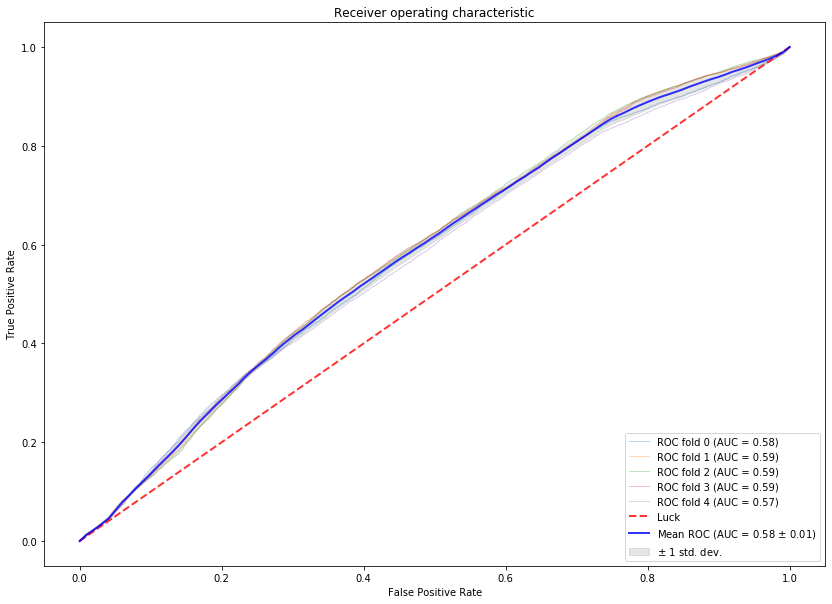

,AUC Train,AUC Test
0,0.578603,0.579542
1,0.585249,0.585942
2,0.585148,0.587142
3,0.585009,0.587010
4,0.580178,0.571824


In [83]:
# Create a Stratified Fold
cv = StratifiedKFold(n_splits=5, random_state=123, shuffle=True)

clf = LogisticRegression()

results = pd.DataFrame(columns=['training_score', 'test_score'])
fprs, tprs, scores,loss = [], [], [] , []
    
for (train, test), i in zip(cv.split(X_train, y_train), range(5)):
    clf.fit(X_train.iloc[train], y_train.iloc[train])
    _, _, auc_score_train = compute_roc_auc(train)
    fpr, tpr, auc_score = compute_roc_auc(test)
    scores.append((auc_score_train, auc_score))
    fprs.append(fpr)
    tprs.append(tpr)
    
    

plot_roc_curve(fprs, tprs);
pd.DataFrame(scores, columns=['AUC Train', 'AUC Test'])

In [84]:
# Model seems to be stable across the th folds hence is stable
# Finding the accuracy on the holdout set
# gini

clf.fit(X_train, y_train)
y_predict = clf.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_predict)
print(f" AUC Score : {auc(fpr,tpr)}")
print(f" Log Loss Score : {log_loss(y_test, y_predict)}")

 AUC Score : 0.5901962380957333
 Log Loss Score : 0.5916604650557927


### Trying to see if Vanilla  Boosting Leads to increase in Score

In [85]:
# Converting the Categorical Variables into integers
Cat_col = []
for col ,dtype in zip(df.columns.tolist(),df.dtypes.to_list()):
    if str(dtype) in ["object","category"]:
        le = LabelEncoder()
        Cat_col.append(col)
        df[col] = le.fit_transform(df[col].astype(str))      

In [86]:
# Creating the hold out set :- 
X = df.drop('islapsed',axis=1)
y = df['islapsed']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42,stratify =y)

In [87]:
# Create a Stratified Fold
def compute_roc_auc(index):
    y_predict = model.predict_proba(X_train.iloc[index])[:,1]
    fpr, tpr, thresholds = roc_curve(y_train.iloc[index], y_predict)
    auc_score = auc(fpr, tpr)
    return fpr, tpr, auc_score


cv = StratifiedKFold(n_splits=5, random_state=123, shuffle=True)

model = lgbm.LGBMClassifier( 
    boosting_type="gbdt",
    metric='None',
    n_estimators=2000)

results = pd.DataFrame(columns=['training_score', 'test_score'])
fprs, tprs, scores,loss = [], [], [] , []
    
for (train, test), i in zip(cv.split(X_train, y_train), range(5)):
    model.fit(X_train.iloc[train],
          y_train.iloc[train],
          categorical_feature= Cat_col,
          eval_set=[(X_train.iloc[test], y_train.iloc[test])], 
          feature_name = X_train.columns.tolist(),
          eval_metric ='auc',
          early_stopping_rounds=100)
    
    _, _, auc_score_train = compute_roc_auc(train)
    fpr, tpr, auc_score = compute_roc_auc(test)
    scores.append((auc_score_train, auc_score))
    fprs.append(fpr)
    tprs.append(tpr)

    

/Users/puneet.jain/opt/anaconda3/lib/python3.7/site-packages/lightgbm/basic.py:1295: UserWarning:

categorical_feature in Dataset is overridden.
New categorical_feature is ['AD_BUILDINGS', 'AD_CONTENTS', 'APPR_ALARM', 'APPR_LOCKS', 'BUILDINGS_COVER', 'BUS_USE', 'CLAIM3YEARS', 'CONTENTS_COVER', 'FLOODING', 'GARDEN_ADDON_POST_REN', 'GARDEN_ADDON_PRE_REN', 'HOME_EM_ADDON_POST_REN', 'HOME_EM_ADDON_PRE_REN', 'HP1_ADDON_POST_REN', 'HP1_ADDON_PRE_REN', 'HP2_ADDON_POST_REN', 'HP2_ADDON_PRE_REN', 'HP3_ADDON_POST_REN', 'HP3_ADDON_PRE_REN', 'KEYCARE_ADDON_POST_REN', 'KEYCARE_ADDON_PRE_REN', 'LEGAL_ADDON_POST_REN', 'LEGAL_ADDON_PRE_REN', 'LISTED', 'MTA_FLAG', 'NEIGH_WATCH', 'OCC_STATUS', 'OWNERSHIP_TYPE', 'P1_EMP_STATUS', 'P1_MAR_STATUS', 'P1_POLICY_REFUSED', 'P1_PT_EMP_STATUS', 'P1_SEX', 'PAYMENT_FREQUENCY', 'PAYMENT_METHOD', 'PROP_TYPE', 'Quote_month', 'RISK_RATED_AREA_B', 'RISK_RATED_AREA_C', 'ROOF_CONSTRUCTION', 'SAFE_INSTALLED', 'SEC_DISC_REQ', 'SUBSIDENCE', 'WALL_CONSTRUCTION', 'coverage_mon

[1]	valid_0's auc: 0.723098
Training until validation scores don't improve for 100 rounds
[2]	valid_0's auc: 0.724429
[3]	valid_0's auc: 0.726929
[4]	valid_0's auc: 0.728057
[5]	valid_0's auc: 0.730326
[6]	valid_0's auc: 0.732261
[7]	valid_0's auc: 0.734336
[8]	valid_0's auc: 0.736037
[9]	valid_0's auc: 0.737083
[10]	valid_0's auc: 0.737951
[11]	valid_0's auc: 0.740531
[12]	valid_0's auc: 0.741542
[13]	valid_0's auc: 0.743143
[14]	valid_0's auc: 0.743786
[15]	valid_0's auc: 0.744285
[16]	valid_0's auc: 0.745207
[17]	valid_0's auc: 0.745825
[18]	valid_0's auc: 0.746887
[19]	valid_0's auc: 0.747825
[20]	valid_0's auc: 0.748423
[21]	valid_0's auc: 0.749327
[22]	valid_0's auc: 0.75033
[23]	valid_0's auc: 0.751213
[24]	valid_0's auc: 0.752208
[25]	valid_0's auc: 0.75318
[26]	valid_0's auc: 0.754011
[27]	valid_0's auc: 0.754605
[28]	valid_0's auc: 0.755166
[29]	valid_0's auc: 0.755544
[30]	valid_0's auc: 0.75666
[31]	valid_0's auc: 0.757054
[32]	valid_0's auc: 0.757907
[33]	valid_0's auc: 0.

[286]	valid_0's auc: 0.76939
[287]	valid_0's auc: 0.769428
[288]	valid_0's auc: 0.769373
[289]	valid_0's auc: 0.7694
[290]	valid_0's auc: 0.769397
[291]	valid_0's auc: 0.769399
[292]	valid_0's auc: 0.76938
[293]	valid_0's auc: 0.769353
[294]	valid_0's auc: 0.769363
[295]	valid_0's auc: 0.769367
[296]	valid_0's auc: 0.769409
[297]	valid_0's auc: 0.769432
[298]	valid_0's auc: 0.769466
[299]	valid_0's auc: 0.769446
[300]	valid_0's auc: 0.769435
[301]	valid_0's auc: 0.769472
[302]	valid_0's auc: 0.769419
[303]	valid_0's auc: 0.769398
[304]	valid_0's auc: 0.769393
[305]	valid_0's auc: 0.769406
[306]	valid_0's auc: 0.769434
[307]	valid_0's auc: 0.769399
[308]	valid_0's auc: 0.769412
[309]	valid_0's auc: 0.769361
[310]	valid_0's auc: 0.769353
[311]	valid_0's auc: 0.769423
[312]	valid_0's auc: 0.769555
[313]	valid_0's auc: 0.769515
[314]	valid_0's auc: 0.769569
[315]	valid_0's auc: 0.769556
[316]	valid_0's auc: 0.769593
[317]	valid_0's auc: 0.769592
[318]	valid_0's auc: 0.769525
[319]	valid_0'

[201]	valid_0's auc: 0.772034
[202]	valid_0's auc: 0.772023
[203]	valid_0's auc: 0.772028
[204]	valid_0's auc: 0.772061
[205]	valid_0's auc: 0.772094
[206]	valid_0's auc: 0.77219
[207]	valid_0's auc: 0.772188
[208]	valid_0's auc: 0.772171
[209]	valid_0's auc: 0.772318
[210]	valid_0's auc: 0.772335
[211]	valid_0's auc: 0.772281
[212]	valid_0's auc: 0.772185
[213]	valid_0's auc: 0.772161
[214]	valid_0's auc: 0.772182
[215]	valid_0's auc: 0.772184
[216]	valid_0's auc: 0.772234
[217]	valid_0's auc: 0.772166
[218]	valid_0's auc: 0.772316
[219]	valid_0's auc: 0.772377
[220]	valid_0's auc: 0.772387
[221]	valid_0's auc: 0.772389
[222]	valid_0's auc: 0.772356
[223]	valid_0's auc: 0.772391
[224]	valid_0's auc: 0.77237
[225]	valid_0's auc: 0.772358
[226]	valid_0's auc: 0.772314
[227]	valid_0's auc: 0.772291
[228]	valid_0's auc: 0.772289
[229]	valid_0's auc: 0.772287
[230]	valid_0's auc: 0.772253
[231]	valid_0's auc: 0.772259
[232]	valid_0's auc: 0.772285
[233]	valid_0's auc: 0.772245
[234]	valid_

[164]	valid_0's auc: 0.774299
[165]	valid_0's auc: 0.77429
[166]	valid_0's auc: 0.774241
[167]	valid_0's auc: 0.774273
[168]	valid_0's auc: 0.774274
[169]	valid_0's auc: 0.774251
[170]	valid_0's auc: 0.774364
[171]	valid_0's auc: 0.774367
[172]	valid_0's auc: 0.774322
[173]	valid_0's auc: 0.77438
[174]	valid_0's auc: 0.774405
[175]	valid_0's auc: 0.774401
[176]	valid_0's auc: 0.774338
[177]	valid_0's auc: 0.774359
[178]	valid_0's auc: 0.774347
[179]	valid_0's auc: 0.774331
[180]	valid_0's auc: 0.774277
[181]	valid_0's auc: 0.774231
[182]	valid_0's auc: 0.774243
[183]	valid_0's auc: 0.774241
[184]	valid_0's auc: 0.774261
[185]	valid_0's auc: 0.774253
[186]	valid_0's auc: 0.774313
[187]	valid_0's auc: 0.774255
[188]	valid_0's auc: 0.774375
[189]	valid_0's auc: 0.774408
[190]	valid_0's auc: 0.774406
[191]	valid_0's auc: 0.774465
[192]	valid_0's auc: 0.774476
[193]	valid_0's auc: 0.774498
[194]	valid_0's auc: 0.774473
[195]	valid_0's auc: 0.774379
[196]	valid_0's auc: 0.774385
[197]	valid_

[149]	valid_0's auc: 0.771191
[150]	valid_0's auc: 0.771212
[151]	valid_0's auc: 0.771191
[152]	valid_0's auc: 0.771164
[153]	valid_0's auc: 0.771111
[154]	valid_0's auc: 0.771083
[155]	valid_0's auc: 0.771064
[156]	valid_0's auc: 0.771084
[157]	valid_0's auc: 0.771056
[158]	valid_0's auc: 0.771052
[159]	valid_0's auc: 0.771095
[160]	valid_0's auc: 0.771133
[161]	valid_0's auc: 0.771122
[162]	valid_0's auc: 0.771073
[163]	valid_0's auc: 0.771105
[164]	valid_0's auc: 0.771072
[165]	valid_0's auc: 0.77106
[166]	valid_0's auc: 0.77109
[167]	valid_0's auc: 0.771102
[168]	valid_0's auc: 0.771216
[169]	valid_0's auc: 0.771189
[170]	valid_0's auc: 0.771174
[171]	valid_0's auc: 0.771143
[172]	valid_0's auc: 0.771142
[173]	valid_0's auc: 0.771145
[174]	valid_0's auc: 0.771114
[175]	valid_0's auc: 0.771092
[176]	valid_0's auc: 0.771016
[177]	valid_0's auc: 0.770956
[178]	valid_0's auc: 0.770976
[179]	valid_0's auc: 0.770947
[180]	valid_0's auc: 0.770891
[181]	valid_0's auc: 0.770924
[182]	valid_

[182]	valid_0's auc: 0.767506
[183]	valid_0's auc: 0.767521
[184]	valid_0's auc: 0.767503
[185]	valid_0's auc: 0.767469
[186]	valid_0's auc: 0.767496
[187]	valid_0's auc: 0.767505
[188]	valid_0's auc: 0.767484
[189]	valid_0's auc: 0.767474
[190]	valid_0's auc: 0.767408
[191]	valid_0's auc: 0.76736
[192]	valid_0's auc: 0.767388
[193]	valid_0's auc: 0.767456
[194]	valid_0's auc: 0.767438
[195]	valid_0's auc: 0.767567
[196]	valid_0's auc: 0.767615
[197]	valid_0's auc: 0.767659
[198]	valid_0's auc: 0.76766
[199]	valid_0's auc: 0.767663
[200]	valid_0's auc: 0.767641
[201]	valid_0's auc: 0.767632
[202]	valid_0's auc: 0.767628
[203]	valid_0's auc: 0.767532
[204]	valid_0's auc: 0.767539
[205]	valid_0's auc: 0.76756
[206]	valid_0's auc: 0.767546
[207]	valid_0's auc: 0.76748
[208]	valid_0's auc: 0.767511
[209]	valid_0's auc: 0.76751
[210]	valid_0's auc: 0.767524
[211]	valid_0's auc: 0.767518
[212]	valid_0's auc: 0.767536
[213]	valid_0's auc: 0.767505
[214]	valid_0's auc: 0.767627
[215]	valid_0's

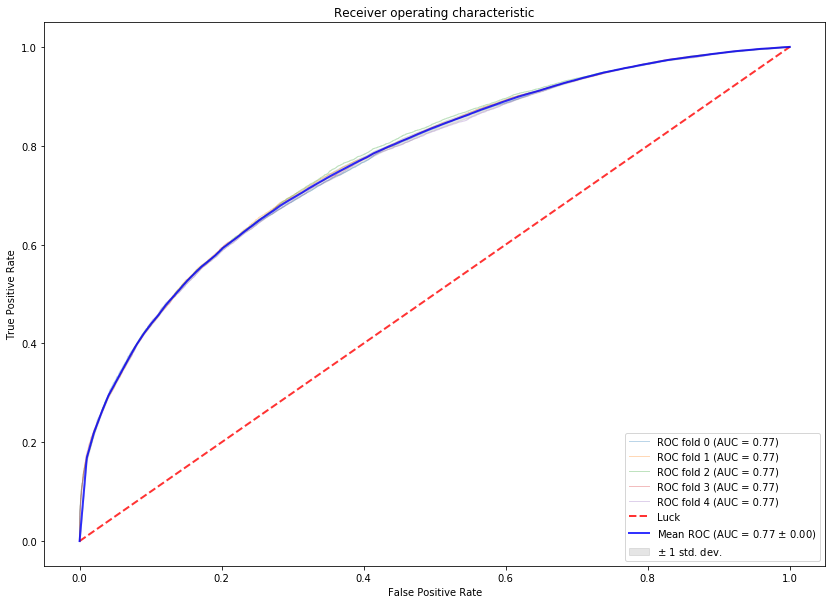

,AUC Train,AUC Test
0,0.834454,0.769869
1,0.826812,0.772391
2,0.821199,0.774498
3,0.812183,0.771219
4,0.838445,0.768116


In [88]:
plot_roc_curve(fprs, tprs)
pd.DataFrame(scores, columns=['AUC Train', 'AUC Test'])

In [89]:
model = lgbm.LGBMClassifier( 
    boosting_type="gbdt",
    is_unbalance=True, 
    num_leaves=60, 
    metric='None',
    feature_fraction=0.5,   
    subsample=0.6,
    learning_rate=0.01,
    n_estimators=3000
)

model.fit(X_train.iloc[train],
          y_train.iloc[train],
          categorical_feature= Cat_col,
          eval_set=[(X_train.iloc[test], y_train.iloc[test])], 
          feature_name = X_train.columns.tolist(),
          eval_metric ='auc',
          early_stopping_rounds=100)

/Users/puneet.jain/opt/anaconda3/lib/python3.7/site-packages/lightgbm/basic.py:1295: UserWarning:

categorical_feature in Dataset is overridden.
New categorical_feature is ['AD_BUILDINGS', 'AD_CONTENTS', 'APPR_ALARM', 'APPR_LOCKS', 'BUILDINGS_COVER', 'BUS_USE', 'CLAIM3YEARS', 'CONTENTS_COVER', 'FLOODING', 'GARDEN_ADDON_POST_REN', 'GARDEN_ADDON_PRE_REN', 'HOME_EM_ADDON_POST_REN', 'HOME_EM_ADDON_PRE_REN', 'HP1_ADDON_POST_REN', 'HP1_ADDON_PRE_REN', 'HP2_ADDON_POST_REN', 'HP2_ADDON_PRE_REN', 'HP3_ADDON_POST_REN', 'HP3_ADDON_PRE_REN', 'KEYCARE_ADDON_POST_REN', 'KEYCARE_ADDON_PRE_REN', 'LEGAL_ADDON_POST_REN', 'LEGAL_ADDON_PRE_REN', 'LISTED', 'MTA_FLAG', 'NEIGH_WATCH', 'OCC_STATUS', 'OWNERSHIP_TYPE', 'P1_EMP_STATUS', 'P1_MAR_STATUS', 'P1_POLICY_REFUSED', 'P1_PT_EMP_STATUS', 'P1_SEX', 'PAYMENT_FREQUENCY', 'PAYMENT_METHOD', 'PROP_TYPE', 'Quote_month', 'RISK_RATED_AREA_B', 'RISK_RATED_AREA_C', 'ROOF_CONSTRUCTION', 'SAFE_INSTALLED', 'SEC_DISC_REQ', 'SUBSIDENCE', 'WALL_CONSTRUCTION', 'coverage_mon

[1]	valid_0's auc: 0.66659
Training until validation scores don't improve for 100 rounds
[2]	valid_0's auc: 0.682288
[3]	valid_0's auc: 0.6989
[4]	valid_0's auc: 0.726978
[5]	valid_0's auc: 0.726651
[6]	valid_0's auc: 0.731341
[7]	valid_0's auc: 0.735154
[8]	valid_0's auc: 0.735318
[9]	valid_0's auc: 0.740146
[10]	valid_0's auc: 0.740961
[11]	valid_0's auc: 0.74211
[12]	valid_0's auc: 0.744238
[13]	valid_0's auc: 0.744611
[14]	valid_0's auc: 0.744482
[15]	valid_0's auc: 0.744882
[16]	valid_0's auc: 0.745168
[17]	valid_0's auc: 0.746247
[18]	valid_0's auc: 0.745776
[19]	valid_0's auc: 0.745549
[20]	valid_0's auc: 0.746032
[21]	valid_0's auc: 0.745754
[22]	valid_0's auc: 0.746049
[23]	valid_0's auc: 0.746083
[24]	valid_0's auc: 0.74553
[25]	valid_0's auc: 0.745677
[26]	valid_0's auc: 0.745851
[27]	valid_0's auc: 0.745804
[28]	valid_0's auc: 0.74598
[29]	valid_0's auc: 0.745955
[30]	valid_0's auc: 0.746627
[31]	valid_0's auc: 0.746652
[32]	valid_0's auc: 0.746867
[33]	valid_0's auc: 0.746

[281]	valid_0's auc: 0.759893
[282]	valid_0's auc: 0.759968
[283]	valid_0's auc: 0.760024
[284]	valid_0's auc: 0.760072
[285]	valid_0's auc: 0.760091
[286]	valid_0's auc: 0.760178
[287]	valid_0's auc: 0.760184
[288]	valid_0's auc: 0.760222
[289]	valid_0's auc: 0.760298
[290]	valid_0's auc: 0.760324
[291]	valid_0's auc: 0.760391
[292]	valid_0's auc: 0.760439
[293]	valid_0's auc: 0.760496
[294]	valid_0's auc: 0.760517
[295]	valid_0's auc: 0.760538
[296]	valid_0's auc: 0.760571
[297]	valid_0's auc: 0.760619
[298]	valid_0's auc: 0.760667
[299]	valid_0's auc: 0.760679
[300]	valid_0's auc: 0.760735
[301]	valid_0's auc: 0.760778
[302]	valid_0's auc: 0.760812
[303]	valid_0's auc: 0.760816
[304]	valid_0's auc: 0.760851
[305]	valid_0's auc: 0.760893
[306]	valid_0's auc: 0.760905
[307]	valid_0's auc: 0.760967
[308]	valid_0's auc: 0.761035
[309]	valid_0's auc: 0.761073
[310]	valid_0's auc: 0.761102
[311]	valid_0's auc: 0.761151
[312]	valid_0's auc: 0.761164
[313]	valid_0's auc: 0.761192
[314]	vali

[562]	valid_0's auc: 0.765685
[563]	valid_0's auc: 0.765687
[564]	valid_0's auc: 0.765698
[565]	valid_0's auc: 0.765697
[566]	valid_0's auc: 0.765702
[567]	valid_0's auc: 0.765727
[568]	valid_0's auc: 0.765744
[569]	valid_0's auc: 0.765766
[570]	valid_0's auc: 0.765773
[571]	valid_0's auc: 0.765808
[572]	valid_0's auc: 0.765816
[573]	valid_0's auc: 0.765825
[574]	valid_0's auc: 0.765834
[575]	valid_0's auc: 0.765838
[576]	valid_0's auc: 0.765866
[577]	valid_0's auc: 0.765899
[578]	valid_0's auc: 0.765912
[579]	valid_0's auc: 0.765934
[580]	valid_0's auc: 0.765926
[581]	valid_0's auc: 0.765964
[582]	valid_0's auc: 0.765981
[583]	valid_0's auc: 0.765995
[584]	valid_0's auc: 0.766006
[585]	valid_0's auc: 0.766026
[586]	valid_0's auc: 0.76604
[587]	valid_0's auc: 0.766048
[588]	valid_0's auc: 0.766059
[589]	valid_0's auc: 0.766066
[590]	valid_0's auc: 0.766071
[591]	valid_0's auc: 0.766081
[592]	valid_0's auc: 0.766106
[593]	valid_0's auc: 0.766106
[594]	valid_0's auc: 0.766112
[595]	valid

[844]	valid_0's auc: 0.76855
[845]	valid_0's auc: 0.768579
[846]	valid_0's auc: 0.768577
[847]	valid_0's auc: 0.76857
[848]	valid_0's auc: 0.768581
[849]	valid_0's auc: 0.768592
[850]	valid_0's auc: 0.768599
[851]	valid_0's auc: 0.768611
[852]	valid_0's auc: 0.768624
[853]	valid_0's auc: 0.76863
[854]	valid_0's auc: 0.768639
[855]	valid_0's auc: 0.768634
[856]	valid_0's auc: 0.76864
[857]	valid_0's auc: 0.768654
[858]	valid_0's auc: 0.768663
[859]	valid_0's auc: 0.768675
[860]	valid_0's auc: 0.768689
[861]	valid_0's auc: 0.768696
[862]	valid_0's auc: 0.768705
[863]	valid_0's auc: 0.768719
[864]	valid_0's auc: 0.768732
[865]	valid_0's auc: 0.768737
[866]	valid_0's auc: 0.768734
[867]	valid_0's auc: 0.768738
[868]	valid_0's auc: 0.768744
[869]	valid_0's auc: 0.768743
[870]	valid_0's auc: 0.768754
[871]	valid_0's auc: 0.76875
[872]	valid_0's auc: 0.768763
[873]	valid_0's auc: 0.76877
[874]	valid_0's auc: 0.768797
[875]	valid_0's auc: 0.768784
[876]	valid_0's auc: 0.768795
[877]	valid_0's 

[1116]	valid_0's auc: 0.769936
[1117]	valid_0's auc: 0.769943
[1118]	valid_0's auc: 0.769944
[1119]	valid_0's auc: 0.769955
[1120]	valid_0's auc: 0.769951
[1121]	valid_0's auc: 0.769955
[1122]	valid_0's auc: 0.769959
[1123]	valid_0's auc: 0.769966
[1124]	valid_0's auc: 0.769966
[1125]	valid_0's auc: 0.769961
[1126]	valid_0's auc: 0.769959
[1127]	valid_0's auc: 0.76997
[1128]	valid_0's auc: 0.769981
[1129]	valid_0's auc: 0.769981
[1130]	valid_0's auc: 0.769976
[1131]	valid_0's auc: 0.769987
[1132]	valid_0's auc: 0.769982
[1133]	valid_0's auc: 0.769986
[1134]	valid_0's auc: 0.769981
[1135]	valid_0's auc: 0.769988
[1136]	valid_0's auc: 0.769988
[1137]	valid_0's auc: 0.769982
[1138]	valid_0's auc: 0.769981
[1139]	valid_0's auc: 0.769983
[1140]	valid_0's auc: 0.76999
[1141]	valid_0's auc: 0.769981
[1142]	valid_0's auc: 0.769989
[1143]	valid_0's auc: 0.769988
[1144]	valid_0's auc: 0.769991
[1145]	valid_0's auc: 0.769999
[1146]	valid_0's auc: 0.770021
[1147]	valid_0's auc: 0.770027
[1148]	val

[1384]	valid_0's auc: 0.770496
[1385]	valid_0's auc: 0.770494
[1386]	valid_0's auc: 0.770493
[1387]	valid_0's auc: 0.770494
[1388]	valid_0's auc: 0.7705
[1389]	valid_0's auc: 0.770497
[1390]	valid_0's auc: 0.770502
[1391]	valid_0's auc: 0.770513
[1392]	valid_0's auc: 0.77051
[1393]	valid_0's auc: 0.770517
[1394]	valid_0's auc: 0.770516
[1395]	valid_0's auc: 0.770515
[1396]	valid_0's auc: 0.770511
[1397]	valid_0's auc: 0.770507
[1398]	valid_0's auc: 0.770497
[1399]	valid_0's auc: 0.770507
[1400]	valid_0's auc: 0.770507
[1401]	valid_0's auc: 0.7705
[1402]	valid_0's auc: 0.770502
[1403]	valid_0's auc: 0.770509
[1404]	valid_0's auc: 0.770512
[1405]	valid_0's auc: 0.770511
[1406]	valid_0's auc: 0.770521
[1407]	valid_0's auc: 0.770516
[1408]	valid_0's auc: 0.770519
[1409]	valid_0's auc: 0.77052
[1410]	valid_0's auc: 0.770524
[1411]	valid_0's auc: 0.770523
[1412]	valid_0's auc: 0.770523
[1413]	valid_0's auc: 0.770517
[1414]	valid_0's auc: 0.770524
[1415]	valid_0's auc: 0.770522
[1416]	valid_0

[1655]	valid_0's auc: 0.770727
[1656]	valid_0's auc: 0.770724
[1657]	valid_0's auc: 0.770714
[1658]	valid_0's auc: 0.770704
[1659]	valid_0's auc: 0.770705
[1660]	valid_0's auc: 0.770704
[1661]	valid_0's auc: 0.770705
[1662]	valid_0's auc: 0.770709
[1663]	valid_0's auc: 0.770705
[1664]	valid_0's auc: 0.770711
[1665]	valid_0's auc: 0.770712
[1666]	valid_0's auc: 0.770706
[1667]	valid_0's auc: 0.770709
[1668]	valid_0's auc: 0.770707
[1669]	valid_0's auc: 0.770708
[1670]	valid_0's auc: 0.770708
[1671]	valid_0's auc: 0.77071
[1672]	valid_0's auc: 0.770707
[1673]	valid_0's auc: 0.770706
[1674]	valid_0's auc: 0.770711
[1675]	valid_0's auc: 0.770715
[1676]	valid_0's auc: 0.770716
[1677]	valid_0's auc: 0.770714
[1678]	valid_0's auc: 0.770713
[1679]	valid_0's auc: 0.770707
[1680]	valid_0's auc: 0.770706
[1681]	valid_0's auc: 0.770707
[1682]	valid_0's auc: 0.770712
[1683]	valid_0's auc: 0.770706
[1684]	valid_0's auc: 0.770711
[1685]	valid_0's auc: 0.770715
[1686]	valid_0's auc: 0.770712
[1687]	va

[1928]	valid_0's auc: 0.770747
[1929]	valid_0's auc: 0.770746
[1930]	valid_0's auc: 0.770752
[1931]	valid_0's auc: 0.77075
[1932]	valid_0's auc: 0.770749
[1933]	valid_0's auc: 0.77075
[1934]	valid_0's auc: 0.770751
[1935]	valid_0's auc: 0.770751
[1936]	valid_0's auc: 0.770749
[1937]	valid_0's auc: 0.77075
[1938]	valid_0's auc: 0.770752
[1939]	valid_0's auc: 0.770754
[1940]	valid_0's auc: 0.770753
[1941]	valid_0's auc: 0.770753
[1942]	valid_0's auc: 0.770763
[1943]	valid_0's auc: 0.770765
[1944]	valid_0's auc: 0.770767
[1945]	valid_0's auc: 0.770773
[1946]	valid_0's auc: 0.770774
[1947]	valid_0's auc: 0.770776
[1948]	valid_0's auc: 0.77078
[1949]	valid_0's auc: 0.770771
[1950]	valid_0's auc: 0.770767
[1951]	valid_0's auc: 0.77077
[1952]	valid_0's auc: 0.770764
[1953]	valid_0's auc: 0.770764
[1954]	valid_0's auc: 0.770762
[1955]	valid_0's auc: 0.770765
[1956]	valid_0's auc: 0.770763
[1957]	valid_0's auc: 0.770757
[1958]	valid_0's auc: 0.770756
[1959]	valid_0's auc: 0.770759
[1960]	valid_

LGBMClassifier(feature_fraction=0.5, is_unbalance=True, learning_rate=0.01,
               metric='None', n_estimators=3000, num_leaves=60, subsample=0.6)

### Plot feature importance 

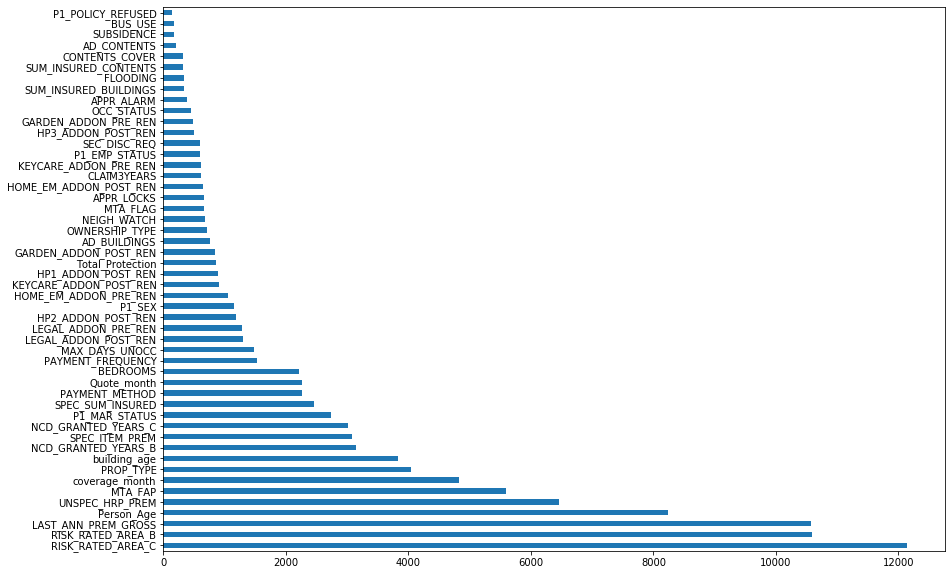

In [90]:
feat_imp = pd.Series(model.feature_importances_, index=X_train.columns)
feat_imp.nlargest(50).plot(kind='barh', figsize=(14,10))

In [91]:
import shap
shap.initjs()

In [92]:
Explainer = shap.TreeExplainer(model)
shap_values = Explainer.shap_values(X_train.iloc[test])

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


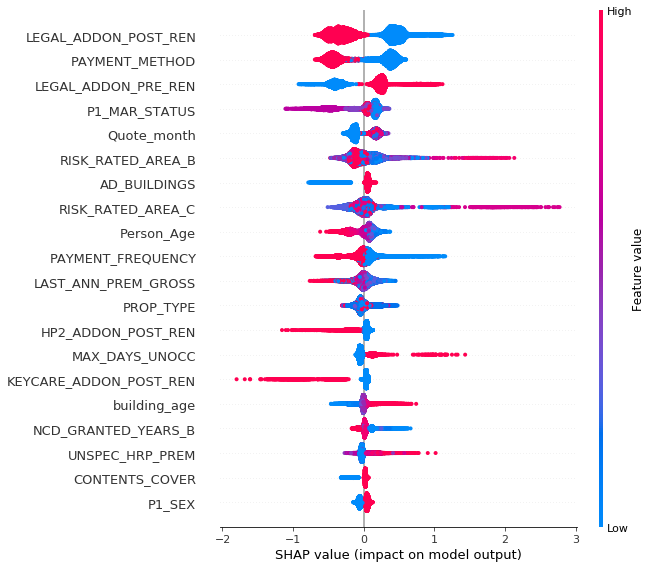

In [93]:
shap.summary_plot(shap_values[1], X_train.iloc[test])

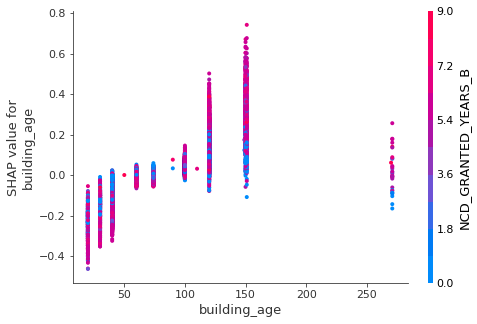

In [94]:
shap.dependence_plot('building_age', shap_values[1], X_train.iloc[test])

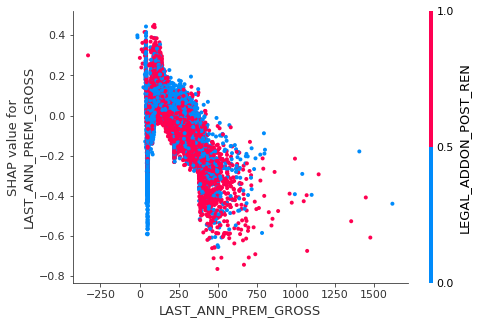

In [95]:
shap.dependence_plot('LAST_ANN_PREM_GROSS', shap_values[1], X_train.iloc[test])

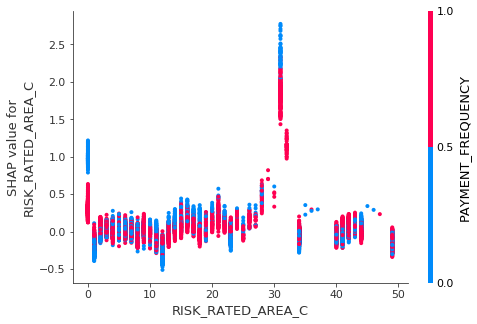

In [96]:
shap.dependence_plot('RISK_RATED_AREA_C', shap_values[1], X_train.iloc[test])

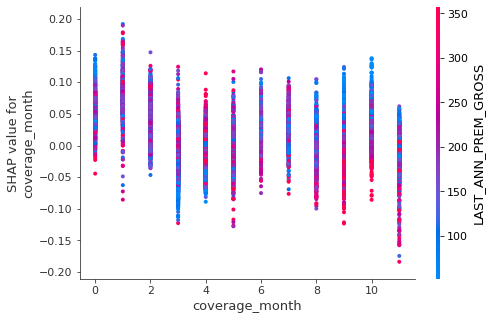

In [97]:
shap.dependence_plot('coverage_month', shap_values[1], X_train.iloc[test])

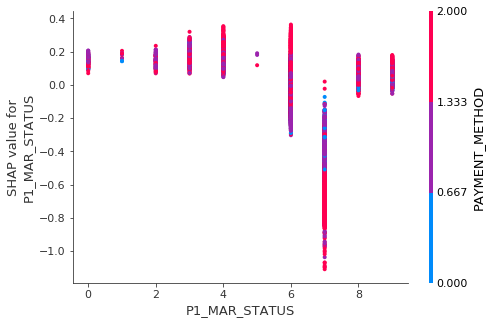

In [102]:
shap.dependence_plot('P1_MAR_STATUS', shap_values[1], X_train.iloc[test])

### Finding the Reason for a Variable causing the Probability to increase or decrease

In [98]:
s_v = Explainer.shap_values(X_train.iloc[100:101])

shap.force_plot(Explainer.expected_value[1], s_v[1],X_train.iloc[100:101])

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [101]:
s_v = Explainer.shap_values(X_train.iloc[700:701])
print("Prediction :",model.predict_proba(X_train.iloc[700:701])[:,1])
shap.force_plot(Explainer.expected_value[1], s_v[1],X_train.iloc[700:701])

Prediction : [0.54712716]


### Hypertune the LightGBM Model and run model Diagnostics 

In [ ]:
train_data = lgbm.Dataset(X_train, label=y_train, categorical_feature=Cat_col)
test_data = lgbm.Dataset(X_train, label=y_train)


model = lgbm.LGBMClassifier( 
    boosting_type="gbdt",
    is_unbalance=True, 
    random_state=10, 
    n_estimators=50,
    num_leaves=30, 
    feature_fraction=0.5,   
    learning_rate=0.01
)

params_opt = {'n_estimators':[500], 
               'num_leaves':range(10,60,5),
               'boosting_type' :['gbdt','dart'],
               'feature_fraction' : [0.5,0.6,0.7,0.8,0.9,1],
               'subsample' : [0.5,0.6,0.7,0.8,0.9,1],
               'learning_rate' : [0.01,0.02,0.05,0.1],
               'min_split_gain' : [0,0.1,0.2,1,2,3,4,5],
              
               }
gridSearchCV = GridSearchCV(estimator = model, 
    param_grid = params_opt,               
    scoring='roc_auc',
    iid=False, 
    verbose=10,
                            
    cv=5)
gridSearchCV.fit(X_train,
                 y_train,
                 categorical_feature= Cat_col,
                feature_name = X_train.columns.tolist()  )

In [ ]:
# We found the above after running the Grid Search. (still potential to Tune)
#CV]  boosting_type=gbdt, feature_fraction=0.5, learning_rate=0.01, min_split_gain=0, n_estimators=500, num_leaves=55, subsample=0.6, score=0.77

In [104]:
# Create a Stratified Fold
def compute_roc_auc(index):
    y_predict = model.predict_proba(X_train.iloc[index])[:,1]
    fpr, tpr, thresholds = roc_curve(y_train.iloc[index], y_predict)
    auc_score = auc(fpr, tpr)
    return fpr, tpr, auc_score


cv = StratifiedKFold(n_splits=5, random_state=123, shuffle=True)

model = lgbm.LGBMClassifier( 
    boosting_type="gbdt",
    is_unbalance=True, 
    num_leaves=60, 
    metric='None',
    feature_fraction=0.5,   
    subsample=0.6,
    learning_rate=0.01,
    n_estimators=3000
)


results = pd.DataFrame(columns=['training_score', 'test_score'])
fprs, tprs, scores,loss = [], [], [] , []
    
for (train, test), i in zip(cv.split(X_train, y_train), range(5)):
    model.fit(X_train.iloc[train],
          y_train.iloc[train],
          categorical_feature= Cat_col,
          eval_set=[(X_train.iloc[test], y_train.iloc[test])], 
          feature_name = X_train.columns.tolist(),
          eval_metric ='auc',
          early_stopping_rounds=100)
    
    _, _, auc_score_train = compute_roc_auc(train)
    fpr, tpr, auc_score = compute_roc_auc(test)
    scores.append((auc_score_train, auc_score))
    fprs.append(fpr)
    tprs.append(tpr)

    

categorical_feature in Dataset is overridden.
New categorical_feature is ['AD_BUILDINGS', 'AD_CONTENTS', 'APPR_ALARM', 'APPR_LOCKS', 'BUILDINGS_COVER', 'BUS_USE', 'CLAIM3YEARS', 'CONTENTS_COVER', 'FLOODING', 'GARDEN_ADDON_POST_REN', 'GARDEN_ADDON_PRE_REN', 'HOME_EM_ADDON_POST_REN', 'HOME_EM_ADDON_PRE_REN', 'HP1_ADDON_POST_REN', 'HP1_ADDON_PRE_REN', 'HP2_ADDON_POST_REN', 'HP2_ADDON_PRE_REN', 'HP3_ADDON_POST_REN', 'HP3_ADDON_PRE_REN', 'KEYCARE_ADDON_POST_REN', 'KEYCARE_ADDON_PRE_REN', 'LEGAL_ADDON_POST_REN', 'LEGAL_ADDON_PRE_REN', 'LISTED', 'MTA_FLAG', 'NEIGH_WATCH', 'OCC_STATUS', 'OWNERSHIP_TYPE', 'P1_EMP_STATUS', 'P1_MAR_STATUS', 'P1_POLICY_REFUSED', 'P1_PT_EMP_STATUS', 'P1_SEX', 'PAYMENT_FREQUENCY', 'PAYMENT_METHOD', 'PROP_TYPE', 'Quote_month', 'RISK_RATED_AREA_B', 'RISK_RATED_AREA_C', 'ROOF_CONSTRUCTION', 'SAFE_INSTALLED', 'SEC_DISC_REQ', 'SUBSIDENCE', 'WALL_CONSTRUCTION', 'coverage_month']


[1]	valid_0's auc: 0.669347
Training until validation scores don't improve for 100 rounds
[2]	valid_0's auc: 0.688189
[3]	valid_0's auc: 0.703717
[4]	valid_0's auc: 0.729676
[5]	valid_0's auc: 0.728084
[6]	valid_0's auc: 0.733036
[7]	valid_0's auc: 0.736811
[8]	valid_0's auc: 0.735877
[9]	valid_0's auc: 0.741453
[10]	valid_0's auc: 0.741765
[11]	valid_0's auc: 0.74269
[12]	valid_0's auc: 0.744775
[13]	valid_0's auc: 0.745359
[14]	valid_0's auc: 0.745779
[15]	valid_0's auc: 0.746196
[16]	valid_0's auc: 0.746515
[17]	valid_0's auc: 0.747752
[18]	valid_0's auc: 0.747267
[19]	valid_0's auc: 0.747194
[20]	valid_0's auc: 0.747515
[21]	valid_0's auc: 0.747327
[22]	valid_0's auc: 0.74755
[23]	valid_0's auc: 0.747654
[24]	valid_0's auc: 0.747204
[25]	valid_0's auc: 0.747488
[26]	valid_0's auc: 0.747617
[27]	valid_0's auc: 0.747385
[28]	valid_0's auc: 0.747433
[29]	valid_0's auc: 0.747612
[30]	valid_0's auc: 0.74822
[31]	valid_0's auc: 0.748131
[32]	valid_0's auc: 0.748323
[33]	valid_0's auc: 0.

[279]	valid_0's auc: 0.760278
[280]	valid_0's auc: 0.760325
[281]	valid_0's auc: 0.760344
[282]	valid_0's auc: 0.760425
[283]	valid_0's auc: 0.760492
[284]	valid_0's auc: 0.760564
[285]	valid_0's auc: 0.760557
[286]	valid_0's auc: 0.760638
[287]	valid_0's auc: 0.760653
[288]	valid_0's auc: 0.760681
[289]	valid_0's auc: 0.760735
[290]	valid_0's auc: 0.760756
[291]	valid_0's auc: 0.760816
[292]	valid_0's auc: 0.760869
[293]	valid_0's auc: 0.760937
[294]	valid_0's auc: 0.76095
[295]	valid_0's auc: 0.760968
[296]	valid_0's auc: 0.761003
[297]	valid_0's auc: 0.761034
[298]	valid_0's auc: 0.761087
[299]	valid_0's auc: 0.761099
[300]	valid_0's auc: 0.761156
[301]	valid_0's auc: 0.761183
[302]	valid_0's auc: 0.761242
[303]	valid_0's auc: 0.761252
[304]	valid_0's auc: 0.761276
[305]	valid_0's auc: 0.761323
[306]	valid_0's auc: 0.761355
[307]	valid_0's auc: 0.761425
[308]	valid_0's auc: 0.761477
[309]	valid_0's auc: 0.761515
[310]	valid_0's auc: 0.761542
[311]	valid_0's auc: 0.761605
[312]	valid

[561]	valid_0's auc: 0.766935
[562]	valid_0's auc: 0.766965
[563]	valid_0's auc: 0.766975
[564]	valid_0's auc: 0.766979
[565]	valid_0's auc: 0.766991
[566]	valid_0's auc: 0.76702
[567]	valid_0's auc: 0.767046
[568]	valid_0's auc: 0.767056
[569]	valid_0's auc: 0.767074
[570]	valid_0's auc: 0.767072
[571]	valid_0's auc: 0.767076
[572]	valid_0's auc: 0.767096
[573]	valid_0's auc: 0.767124
[574]	valid_0's auc: 0.767137
[575]	valid_0's auc: 0.767163
[576]	valid_0's auc: 0.767168
[577]	valid_0's auc: 0.767188
[578]	valid_0's auc: 0.767203
[579]	valid_0's auc: 0.767238
[580]	valid_0's auc: 0.767254
[581]	valid_0's auc: 0.767295
[582]	valid_0's auc: 0.767309
[583]	valid_0's auc: 0.767318
[584]	valid_0's auc: 0.767341
[585]	valid_0's auc: 0.767355
[586]	valid_0's auc: 0.767357
[587]	valid_0's auc: 0.767375
[588]	valid_0's auc: 0.767386
[589]	valid_0's auc: 0.767376
[590]	valid_0's auc: 0.767385
[591]	valid_0's auc: 0.767392
[592]	valid_0's auc: 0.767422
[593]	valid_0's auc: 0.767424
[594]	valid

[837]	valid_0's auc: 0.770277
[838]	valid_0's auc: 0.770296
[839]	valid_0's auc: 0.770308
[840]	valid_0's auc: 0.770313
[841]	valid_0's auc: 0.77032
[842]	valid_0's auc: 0.770328
[843]	valid_0's auc: 0.770319
[844]	valid_0's auc: 0.770325
[845]	valid_0's auc: 0.770341
[846]	valid_0's auc: 0.770347
[847]	valid_0's auc: 0.770351
[848]	valid_0's auc: 0.770378
[849]	valid_0's auc: 0.770387
[850]	valid_0's auc: 0.770396
[851]	valid_0's auc: 0.770411
[852]	valid_0's auc: 0.770438
[853]	valid_0's auc: 0.770437
[854]	valid_0's auc: 0.770452
[855]	valid_0's auc: 0.770465
[856]	valid_0's auc: 0.770475
[857]	valid_0's auc: 0.770481
[858]	valid_0's auc: 0.770497
[859]	valid_0's auc: 0.770511
[860]	valid_0's auc: 0.770514
[861]	valid_0's auc: 0.770515
[862]	valid_0's auc: 0.770527
[863]	valid_0's auc: 0.770528
[864]	valid_0's auc: 0.770532
[865]	valid_0's auc: 0.770538
[866]	valid_0's auc: 0.770542
[867]	valid_0's auc: 0.770549
[868]	valid_0's auc: 0.770557
[869]	valid_0's auc: 0.770558
[870]	valid

[1114]	valid_0's auc: 0.771903
[1115]	valid_0's auc: 0.771908
[1116]	valid_0's auc: 0.771909
[1117]	valid_0's auc: 0.771917
[1118]	valid_0's auc: 0.77191
[1119]	valid_0's auc: 0.771913
[1120]	valid_0's auc: 0.771931
[1121]	valid_0's auc: 0.771927
[1122]	valid_0's auc: 0.771932
[1123]	valid_0's auc: 0.77194
[1124]	valid_0's auc: 0.771952
[1125]	valid_0's auc: 0.771964
[1126]	valid_0's auc: 0.771977
[1127]	valid_0's auc: 0.771985
[1128]	valid_0's auc: 0.771997
[1129]	valid_0's auc: 0.771999
[1130]	valid_0's auc: 0.772004
[1131]	valid_0's auc: 0.772014
[1132]	valid_0's auc: 0.772016
[1133]	valid_0's auc: 0.772026
[1134]	valid_0's auc: 0.772026
[1135]	valid_0's auc: 0.772017
[1136]	valid_0's auc: 0.772029
[1137]	valid_0's auc: 0.772037
[1138]	valid_0's auc: 0.772031
[1139]	valid_0's auc: 0.772035
[1140]	valid_0's auc: 0.772039
[1141]	valid_0's auc: 0.772041
[1142]	valid_0's auc: 0.772045
[1143]	valid_0's auc: 0.772048
[1144]	valid_0's auc: 0.772053
[1145]	valid_0's auc: 0.772067
[1146]	val

[1379]	valid_0's auc: 0.772712
[1380]	valid_0's auc: 0.77273
[1381]	valid_0's auc: 0.772726
[1382]	valid_0's auc: 0.772733
[1383]	valid_0's auc: 0.772733
[1384]	valid_0's auc: 0.772731
[1385]	valid_0's auc: 0.772735
[1386]	valid_0's auc: 0.772735
[1387]	valid_0's auc: 0.772732
[1388]	valid_0's auc: 0.772741
[1389]	valid_0's auc: 0.772736
[1390]	valid_0's auc: 0.772732
[1391]	valid_0's auc: 0.772735
[1392]	valid_0's auc: 0.772741
[1393]	valid_0's auc: 0.772747
[1394]	valid_0's auc: 0.772749
[1395]	valid_0's auc: 0.772741
[1396]	valid_0's auc: 0.77275
[1397]	valid_0's auc: 0.772753
[1398]	valid_0's auc: 0.77275
[1399]	valid_0's auc: 0.772762
[1400]	valid_0's auc: 0.772767
[1401]	valid_0's auc: 0.772761
[1402]	valid_0's auc: 0.772759
[1403]	valid_0's auc: 0.772758
[1404]	valid_0's auc: 0.772761
[1405]	valid_0's auc: 0.772762
[1406]	valid_0's auc: 0.772767
[1407]	valid_0's auc: 0.772769
[1408]	valid_0's auc: 0.772778
[1409]	valid_0's auc: 0.772788
[1410]	valid_0's auc: 0.772792
[1411]	vali

[1648]	valid_0's auc: 0.773173
[1649]	valid_0's auc: 0.773175
[1650]	valid_0's auc: 0.773192
[1651]	valid_0's auc: 0.773191
[1652]	valid_0's auc: 0.773192
[1653]	valid_0's auc: 0.773199
[1654]	valid_0's auc: 0.773203
[1655]	valid_0's auc: 0.773198
[1656]	valid_0's auc: 0.773199
[1657]	valid_0's auc: 0.773203
[1658]	valid_0's auc: 0.773205
[1659]	valid_0's auc: 0.773199
[1660]	valid_0's auc: 0.773201
[1661]	valid_0's auc: 0.773199
[1662]	valid_0's auc: 0.773207
[1663]	valid_0's auc: 0.773199
[1664]	valid_0's auc: 0.773207
[1665]	valid_0's auc: 0.773208
[1666]	valid_0's auc: 0.773208
[1667]	valid_0's auc: 0.773212
[1668]	valid_0's auc: 0.77321
[1669]	valid_0's auc: 0.773212
[1670]	valid_0's auc: 0.773216
[1671]	valid_0's auc: 0.773219
[1672]	valid_0's auc: 0.773214
[1673]	valid_0's auc: 0.773206
[1674]	valid_0's auc: 0.773212
[1675]	valid_0's auc: 0.773214
[1676]	valid_0's auc: 0.773214
[1677]	valid_0's auc: 0.773218
[1678]	valid_0's auc: 0.77322
[1679]	valid_0's auc: 0.773218
[1680]	val

[1920]	valid_0's auc: 0.773384
[1921]	valid_0's auc: 0.77339
[1922]	valid_0's auc: 0.773391
[1923]	valid_0's auc: 0.773386
[1924]	valid_0's auc: 0.773379
[1925]	valid_0's auc: 0.773377
[1926]	valid_0's auc: 0.773381
[1927]	valid_0's auc: 0.773374
[1928]	valid_0's auc: 0.773379
[1929]	valid_0's auc: 0.773378
[1930]	valid_0's auc: 0.773382
[1931]	valid_0's auc: 0.773389
[1932]	valid_0's auc: 0.773384
[1933]	valid_0's auc: 0.77338
[1934]	valid_0's auc: 0.773382
[1935]	valid_0's auc: 0.773387
[1936]	valid_0's auc: 0.773384
[1937]	valid_0's auc: 0.773382
[1938]	valid_0's auc: 0.773387
[1939]	valid_0's auc: 0.773389
[1940]	valid_0's auc: 0.773394
[1941]	valid_0's auc: 0.773394
[1942]	valid_0's auc: 0.773383
[1943]	valid_0's auc: 0.773383
[1944]	valid_0's auc: 0.77338
[1945]	valid_0's auc: 0.77337
[1946]	valid_0's auc: 0.77337
[1947]	valid_0's auc: 0.773394
[1948]	valid_0's auc: 0.773389
[1949]	valid_0's auc: 0.773391
[1950]	valid_0's auc: 0.773392
[1951]	valid_0's auc: 0.773389
[1952]	valid_

[244]	valid_0's auc: 0.762814
[245]	valid_0's auc: 0.762848
[246]	valid_0's auc: 0.762886
[247]	valid_0's auc: 0.762864
[248]	valid_0's auc: 0.762869
[249]	valid_0's auc: 0.762915
[250]	valid_0's auc: 0.762914
[251]	valid_0's auc: 0.762953
[252]	valid_0's auc: 0.762967
[253]	valid_0's auc: 0.762958
[254]	valid_0's auc: 0.763032
[255]	valid_0's auc: 0.763081
[256]	valid_0's auc: 0.763106
[257]	valid_0's auc: 0.763098
[258]	valid_0's auc: 0.763115
[259]	valid_0's auc: 0.763107
[260]	valid_0's auc: 0.763172
[261]	valid_0's auc: 0.763209
[262]	valid_0's auc: 0.76321
[263]	valid_0's auc: 0.763239
[264]	valid_0's auc: 0.763226
[265]	valid_0's auc: 0.763254
[266]	valid_0's auc: 0.763293
[267]	valid_0's auc: 0.763296
[268]	valid_0's auc: 0.763348
[269]	valid_0's auc: 0.763417
[270]	valid_0's auc: 0.763457
[271]	valid_0's auc: 0.763466
[272]	valid_0's auc: 0.76345
[273]	valid_0's auc: 0.763483
[274]	valid_0's auc: 0.763508
[275]	valid_0's auc: 0.763525
[276]	valid_0's auc: 0.763562
[277]	valid_

[519]	valid_0's auc: 0.768699
[520]	valid_0's auc: 0.76871
[521]	valid_0's auc: 0.768729
[522]	valid_0's auc: 0.76874
[523]	valid_0's auc: 0.768751
[524]	valid_0's auc: 0.768758
[525]	valid_0's auc: 0.768759
[526]	valid_0's auc: 0.768778
[527]	valid_0's auc: 0.768779
[528]	valid_0's auc: 0.768815
[529]	valid_0's auc: 0.768847
[530]	valid_0's auc: 0.768862
[531]	valid_0's auc: 0.768868
[532]	valid_0's auc: 0.76888
[533]	valid_0's auc: 0.768908
[534]	valid_0's auc: 0.768961
[535]	valid_0's auc: 0.768969
[536]	valid_0's auc: 0.768985
[537]	valid_0's auc: 0.769018
[538]	valid_0's auc: 0.769033
[539]	valid_0's auc: 0.769044
[540]	valid_0's auc: 0.769065
[541]	valid_0's auc: 0.7691
[542]	valid_0's auc: 0.769106
[543]	valid_0's auc: 0.769128
[544]	valid_0's auc: 0.769139
[545]	valid_0's auc: 0.769144
[546]	valid_0's auc: 0.769146
[547]	valid_0's auc: 0.769151
[548]	valid_0's auc: 0.769164
[549]	valid_0's auc: 0.769163
[550]	valid_0's auc: 0.769174
[551]	valid_0's auc: 0.76919
[552]	valid_0's 

[795]	valid_0's auc: 0.771962
[796]	valid_0's auc: 0.77198
[797]	valid_0's auc: 0.771994
[798]	valid_0's auc: 0.771992
[799]	valid_0's auc: 0.772005
[800]	valid_0's auc: 0.77202
[801]	valid_0's auc: 0.772036
[802]	valid_0's auc: 0.772047
[803]	valid_0's auc: 0.772053
[804]	valid_0's auc: 0.772084
[805]	valid_0's auc: 0.7721
[806]	valid_0's auc: 0.772116
[807]	valid_0's auc: 0.772138
[808]	valid_0's auc: 0.772145
[809]	valid_0's auc: 0.772152
[810]	valid_0's auc: 0.77216
[811]	valid_0's auc: 0.772159
[812]	valid_0's auc: 0.77217
[813]	valid_0's auc: 0.772177
[814]	valid_0's auc: 0.772191
[815]	valid_0's auc: 0.772191
[816]	valid_0's auc: 0.772197
[817]	valid_0's auc: 0.77221
[818]	valid_0's auc: 0.772223
[819]	valid_0's auc: 0.772231
[820]	valid_0's auc: 0.772235
[821]	valid_0's auc: 0.772246
[822]	valid_0's auc: 0.772257
[823]	valid_0's auc: 0.772264
[824]	valid_0's auc: 0.772272
[825]	valid_0's auc: 0.772298
[826]	valid_0's auc: 0.772318
[827]	valid_0's auc: 0.772334
[828]	valid_0's a

[1074]	valid_0's auc: 0.774113
[1075]	valid_0's auc: 0.774125
[1076]	valid_0's auc: 0.774123
[1077]	valid_0's auc: 0.774127
[1078]	valid_0's auc: 0.774124
[1079]	valid_0's auc: 0.774124
[1080]	valid_0's auc: 0.774132
[1081]	valid_0's auc: 0.774132
[1082]	valid_0's auc: 0.774134
[1083]	valid_0's auc: 0.774139
[1084]	valid_0's auc: 0.774136
[1085]	valid_0's auc: 0.774148
[1086]	valid_0's auc: 0.774149
[1087]	valid_0's auc: 0.774157
[1088]	valid_0's auc: 0.774167
[1089]	valid_0's auc: 0.774164
[1090]	valid_0's auc: 0.77416
[1091]	valid_0's auc: 0.774172
[1092]	valid_0's auc: 0.774167
[1093]	valid_0's auc: 0.774183
[1094]	valid_0's auc: 0.774187
[1095]	valid_0's auc: 0.774199
[1096]	valid_0's auc: 0.774218
[1097]	valid_0's auc: 0.77421
[1098]	valid_0's auc: 0.774225
[1099]	valid_0's auc: 0.774227
[1100]	valid_0's auc: 0.774229
[1101]	valid_0's auc: 0.774234
[1102]	valid_0's auc: 0.774242
[1103]	valid_0's auc: 0.774234
[1104]	valid_0's auc: 0.774238
[1105]	valid_0's auc: 0.774233
[1106]	val

[1343]	valid_0's auc: 0.774989
[1344]	valid_0's auc: 0.774978
[1345]	valid_0's auc: 0.774989
[1346]	valid_0's auc: 0.774993
[1347]	valid_0's auc: 0.774993
[1348]	valid_0's auc: 0.775005
[1349]	valid_0's auc: 0.775013
[1350]	valid_0's auc: 0.77501
[1351]	valid_0's auc: 0.775008
[1352]	valid_0's auc: 0.775017
[1353]	valid_0's auc: 0.775022
[1354]	valid_0's auc: 0.775019
[1355]	valid_0's auc: 0.775024
[1356]	valid_0's auc: 0.775025
[1357]	valid_0's auc: 0.775029
[1358]	valid_0's auc: 0.775043
[1359]	valid_0's auc: 0.775045
[1360]	valid_0's auc: 0.775047
[1361]	valid_0's auc: 0.775045
[1362]	valid_0's auc: 0.775042
[1363]	valid_0's auc: 0.775041
[1364]	valid_0's auc: 0.775055
[1365]	valid_0's auc: 0.775054
[1366]	valid_0's auc: 0.775051
[1367]	valid_0's auc: 0.775056
[1368]	valid_0's auc: 0.775055
[1369]	valid_0's auc: 0.775044
[1370]	valid_0's auc: 0.775046
[1371]	valid_0's auc: 0.77505
[1372]	valid_0's auc: 0.775052
[1373]	valid_0's auc: 0.775063
[1374]	valid_0's auc: 0.77507
[1375]	vali

[1618]	valid_0's auc: 0.775518
[1619]	valid_0's auc: 0.775516
[1620]	valid_0's auc: 0.775523
[1621]	valid_0's auc: 0.775521
[1622]	valid_0's auc: 0.775515
[1623]	valid_0's auc: 0.775523
[1624]	valid_0's auc: 0.775521
[1625]	valid_0's auc: 0.775527
[1626]	valid_0's auc: 0.775529
[1627]	valid_0's auc: 0.77553
[1628]	valid_0's auc: 0.775536
[1629]	valid_0's auc: 0.775541
[1630]	valid_0's auc: 0.775539
[1631]	valid_0's auc: 0.775538
[1632]	valid_0's auc: 0.775535
[1633]	valid_0's auc: 0.775533
[1634]	valid_0's auc: 0.77554
[1635]	valid_0's auc: 0.775547
[1636]	valid_0's auc: 0.77555
[1637]	valid_0's auc: 0.775557
[1638]	valid_0's auc: 0.775558
[1639]	valid_0's auc: 0.775558
[1640]	valid_0's auc: 0.775554
[1641]	valid_0's auc: 0.775556
[1642]	valid_0's auc: 0.775561
[1643]	valid_0's auc: 0.775555
[1644]	valid_0's auc: 0.775553
[1645]	valid_0's auc: 0.775553
[1646]	valid_0's auc: 0.775556
[1647]	valid_0's auc: 0.775553
[1648]	valid_0's auc: 0.775554
[1649]	valid_0's auc: 0.775551
[1650]	vali

[1892]	valid_0's auc: 0.775825
[1893]	valid_0's auc: 0.775823
[1894]	valid_0's auc: 0.775821
[1895]	valid_0's auc: 0.77582
[1896]	valid_0's auc: 0.775825
[1897]	valid_0's auc: 0.775838
[1898]	valid_0's auc: 0.775839
[1899]	valid_0's auc: 0.775835
[1900]	valid_0's auc: 0.77583
[1901]	valid_0's auc: 0.775833
[1902]	valid_0's auc: 0.775838
[1903]	valid_0's auc: 0.775844
[1904]	valid_0's auc: 0.775845
[1905]	valid_0's auc: 0.775843
[1906]	valid_0's auc: 0.775841
[1907]	valid_0's auc: 0.775838
[1908]	valid_0's auc: 0.775844
[1909]	valid_0's auc: 0.775834
[1910]	valid_0's auc: 0.775837
[1911]	valid_0's auc: 0.775829
[1912]	valid_0's auc: 0.775832
[1913]	valid_0's auc: 0.775842
[1914]	valid_0's auc: 0.775851
[1915]	valid_0's auc: 0.775854
[1916]	valid_0's auc: 0.775853
[1917]	valid_0's auc: 0.775849
[1918]	valid_0's auc: 0.775853
[1919]	valid_0's auc: 0.775854
[1920]	valid_0's auc: 0.775855
[1921]	valid_0's auc: 0.775849
[1922]	valid_0's auc: 0.775846
[1923]	valid_0's auc: 0.775852
[1924]	val

[2165]	valid_0's auc: 0.776011
[2166]	valid_0's auc: 0.776007
[2167]	valid_0's auc: 0.776006
[2168]	valid_0's auc: 0.776001
[2169]	valid_0's auc: 0.776
[2170]	valid_0's auc: 0.775998
[2171]	valid_0's auc: 0.77599
[2172]	valid_0's auc: 0.776
[2173]	valid_0's auc: 0.776006
[2174]	valid_0's auc: 0.776008
[2175]	valid_0's auc: 0.776009
[2176]	valid_0's auc: 0.776007
[2177]	valid_0's auc: 0.776008
[2178]	valid_0's auc: 0.776011
[2179]	valid_0's auc: 0.776011
[2180]	valid_0's auc: 0.77602
[2181]	valid_0's auc: 0.776018
[2182]	valid_0's auc: 0.776016
[2183]	valid_0's auc: 0.776014
[2184]	valid_0's auc: 0.776014
[2185]	valid_0's auc: 0.776013
[2186]	valid_0's auc: 0.776012
[2187]	valid_0's auc: 0.77602
[2188]	valid_0's auc: 0.776032
[2189]	valid_0's auc: 0.776033
[2190]	valid_0's auc: 0.776028
[2191]	valid_0's auc: 0.776029
[2192]	valid_0's auc: 0.776026
[2193]	valid_0's auc: 0.776028
[2194]	valid_0's auc: 0.776029
[2195]	valid_0's auc: 0.776026
[2196]	valid_0's auc: 0.776028
[2197]	valid_0's 

[2433]	valid_0's auc: 0.776077
[2434]	valid_0's auc: 0.776075
[2435]	valid_0's auc: 0.776072
[2436]	valid_0's auc: 0.77607
[2437]	valid_0's auc: 0.77607
[2438]	valid_0's auc: 0.776067
[2439]	valid_0's auc: 0.776059
[2440]	valid_0's auc: 0.776056
[2441]	valid_0's auc: 0.776053
[2442]	valid_0's auc: 0.776061
[2443]	valid_0's auc: 0.776062
[2444]	valid_0's auc: 0.776073
[2445]	valid_0's auc: 0.776073
[2446]	valid_0's auc: 0.776071
[2447]	valid_0's auc: 0.776089
[2448]	valid_0's auc: 0.776086
[2449]	valid_0's auc: 0.77608
[2450]	valid_0's auc: 0.776079
[2451]	valid_0's auc: 0.776079
[2452]	valid_0's auc: 0.776082
[2453]	valid_0's auc: 0.776079
[2454]	valid_0's auc: 0.776081
[2455]	valid_0's auc: 0.77608
[2456]	valid_0's auc: 0.77608
[2457]	valid_0's auc: 0.77608
[2458]	valid_0's auc: 0.776081
[2459]	valid_0's auc: 0.776082
[2460]	valid_0's auc: 0.776088
[2461]	valid_0's auc: 0.776091
[2462]	valid_0's auc: 0.7761
[2463]	valid_0's auc: 0.776099
[2464]	valid_0's auc: 0.776105
[2465]	valid_0's

[43]	valid_0's auc: 0.753412
[44]	valid_0's auc: 0.753576
[45]	valid_0's auc: 0.75362
[46]	valid_0's auc: 0.753451
[47]	valid_0's auc: 0.754005
[48]	valid_0's auc: 0.753975
[49]	valid_0's auc: 0.754268
[50]	valid_0's auc: 0.754438
[51]	valid_0's auc: 0.754529
[52]	valid_0's auc: 0.754396
[53]	valid_0's auc: 0.754543
[54]	valid_0's auc: 0.754433
[55]	valid_0's auc: 0.754482
[56]	valid_0's auc: 0.754539
[57]	valid_0's auc: 0.754515
[58]	valid_0's auc: 0.754684
[59]	valid_0's auc: 0.754527
[60]	valid_0's auc: 0.754662
[61]	valid_0's auc: 0.754675
[62]	valid_0's auc: 0.754654
[63]	valid_0's auc: 0.754899
[64]	valid_0's auc: 0.755013
[65]	valid_0's auc: 0.755025
[66]	valid_0's auc: 0.754989
[67]	valid_0's auc: 0.754979
[68]	valid_0's auc: 0.754906
[69]	valid_0's auc: 0.754871
[70]	valid_0's auc: 0.754781
[71]	valid_0's auc: 0.754743
[72]	valid_0's auc: 0.754917
[73]	valid_0's auc: 0.75499
[74]	valid_0's auc: 0.755165
[75]	valid_0's auc: 0.755312
[76]	valid_0's auc: 0.755443
[77]	valid_0's a

[326]	valid_0's auc: 0.766606
[327]	valid_0's auc: 0.76663
[328]	valid_0's auc: 0.766658
[329]	valid_0's auc: 0.766687
[330]	valid_0's auc: 0.766713
[331]	valid_0's auc: 0.766763
[332]	valid_0's auc: 0.76682
[333]	valid_0's auc: 0.766821
[334]	valid_0's auc: 0.766818
[335]	valid_0's auc: 0.766841
[336]	valid_0's auc: 0.766866
[337]	valid_0's auc: 0.766891
[338]	valid_0's auc: 0.76691
[339]	valid_0's auc: 0.766921
[340]	valid_0's auc: 0.766937
[341]	valid_0's auc: 0.766959
[342]	valid_0's auc: 0.76697
[343]	valid_0's auc: 0.766988
[344]	valid_0's auc: 0.767029
[345]	valid_0's auc: 0.767063
[346]	valid_0's auc: 0.767081
[347]	valid_0's auc: 0.767127
[348]	valid_0's auc: 0.767178
[349]	valid_0's auc: 0.76719
[350]	valid_0's auc: 0.767208
[351]	valid_0's auc: 0.767214
[352]	valid_0's auc: 0.767235
[353]	valid_0's auc: 0.767254
[354]	valid_0's auc: 0.767297
[355]	valid_0's auc: 0.767307
[356]	valid_0's auc: 0.767323
[357]	valid_0's auc: 0.767394
[358]	valid_0's auc: 0.767438
[359]	valid_0's

[606]	valid_0's auc: 0.77129
[607]	valid_0's auc: 0.771311
[608]	valid_0's auc: 0.771318
[609]	valid_0's auc: 0.771367
[610]	valid_0's auc: 0.771397
[611]	valid_0's auc: 0.77141
[612]	valid_0's auc: 0.771422
[613]	valid_0's auc: 0.771429
[614]	valid_0's auc: 0.771447
[615]	valid_0's auc: 0.771446
[616]	valid_0's auc: 0.771457
[617]	valid_0's auc: 0.771459
[618]	valid_0's auc: 0.771477
[619]	valid_0's auc: 0.771489
[620]	valid_0's auc: 0.77151
[621]	valid_0's auc: 0.771527
[622]	valid_0's auc: 0.771526
[623]	valid_0's auc: 0.77154
[624]	valid_0's auc: 0.771547
[625]	valid_0's auc: 0.771577
[626]	valid_0's auc: 0.771594
[627]	valid_0's auc: 0.771622
[628]	valid_0's auc: 0.771618
[629]	valid_0's auc: 0.771632
[630]	valid_0's auc: 0.77164
[631]	valid_0's auc: 0.771642
[632]	valid_0's auc: 0.771651
[633]	valid_0's auc: 0.771677
[634]	valid_0's auc: 0.771686
[635]	valid_0's auc: 0.771708
[636]	valid_0's auc: 0.771708
[637]	valid_0's auc: 0.771727
[638]	valid_0's auc: 0.771733
[639]	valid_0's

[884]	valid_0's auc: 0.773949
[885]	valid_0's auc: 0.773954
[886]	valid_0's auc: 0.773962
[887]	valid_0's auc: 0.773961
[888]	valid_0's auc: 0.773961
[889]	valid_0's auc: 0.773958
[890]	valid_0's auc: 0.773975
[891]	valid_0's auc: 0.773975
[892]	valid_0's auc: 0.773991
[893]	valid_0's auc: 0.774004
[894]	valid_0's auc: 0.774018
[895]	valid_0's auc: 0.774017
[896]	valid_0's auc: 0.774045
[897]	valid_0's auc: 0.774041
[898]	valid_0's auc: 0.774049
[899]	valid_0's auc: 0.77405
[900]	valid_0's auc: 0.77406
[901]	valid_0's auc: 0.774073
[902]	valid_0's auc: 0.774085
[903]	valid_0's auc: 0.774111
[904]	valid_0's auc: 0.774115
[905]	valid_0's auc: 0.774126
[906]	valid_0's auc: 0.774123
[907]	valid_0's auc: 0.774134
[908]	valid_0's auc: 0.774151
[909]	valid_0's auc: 0.774158
[910]	valid_0's auc: 0.774171
[911]	valid_0's auc: 0.774192
[912]	valid_0's auc: 0.774197
[913]	valid_0's auc: 0.774198
[914]	valid_0's auc: 0.774191
[915]	valid_0's auc: 0.774211
[916]	valid_0's auc: 0.774232
[917]	valid_

[1155]	valid_0's auc: 0.775441
[1156]	valid_0's auc: 0.775451
[1157]	valid_0's auc: 0.775459
[1158]	valid_0's auc: 0.775467
[1159]	valid_0's auc: 0.775465
[1160]	valid_0's auc: 0.775464
[1161]	valid_0's auc: 0.775469
[1162]	valid_0's auc: 0.775469
[1163]	valid_0's auc: 0.775469
[1164]	valid_0's auc: 0.775473
[1165]	valid_0's auc: 0.775476
[1166]	valid_0's auc: 0.775483
[1167]	valid_0's auc: 0.775501
[1168]	valid_0's auc: 0.775511
[1169]	valid_0's auc: 0.77551
[1170]	valid_0's auc: 0.77551
[1171]	valid_0's auc: 0.775516
[1172]	valid_0's auc: 0.775522
[1173]	valid_0's auc: 0.775517
[1174]	valid_0's auc: 0.77552
[1175]	valid_0's auc: 0.775514
[1176]	valid_0's auc: 0.775522
[1177]	valid_0's auc: 0.775532
[1178]	valid_0's auc: 0.775538
[1179]	valid_0's auc: 0.77553
[1180]	valid_0's auc: 0.775542
[1181]	valid_0's auc: 0.775547
[1182]	valid_0's auc: 0.775554
[1183]	valid_0's auc: 0.775564
[1184]	valid_0's auc: 0.775561
[1185]	valid_0's auc: 0.775565
[1186]	valid_0's auc: 0.775565
[1187]	valid

[1424]	valid_0's auc: 0.776032
[1425]	valid_0's auc: 0.776031
[1426]	valid_0's auc: 0.77604
[1427]	valid_0's auc: 0.776047
[1428]	valid_0's auc: 0.776046
[1429]	valid_0's auc: 0.77605
[1430]	valid_0's auc: 0.776066
[1431]	valid_0's auc: 0.776078
[1432]	valid_0's auc: 0.776081
[1433]	valid_0's auc: 0.77608
[1434]	valid_0's auc: 0.776087
[1435]	valid_0's auc: 0.776095
[1436]	valid_0's auc: 0.776093
[1437]	valid_0's auc: 0.776097
[1438]	valid_0's auc: 0.776116
[1439]	valid_0's auc: 0.776117
[1440]	valid_0's auc: 0.776112
[1441]	valid_0's auc: 0.776117
[1442]	valid_0's auc: 0.776121
[1443]	valid_0's auc: 0.776125
[1444]	valid_0's auc: 0.776131
[1445]	valid_0's auc: 0.776127
[1446]	valid_0's auc: 0.776136
[1447]	valid_0's auc: 0.776134
[1448]	valid_0's auc: 0.776134
[1449]	valid_0's auc: 0.776139
[1450]	valid_0's auc: 0.776128
[1451]	valid_0's auc: 0.776136
[1452]	valid_0's auc: 0.776131
[1453]	valid_0's auc: 0.77614
[1454]	valid_0's auc: 0.77614
[1455]	valid_0's auc: 0.776137
[1456]	valid_

[1695]	valid_0's auc: 0.776407
[1696]	valid_0's auc: 0.776413
[1697]	valid_0's auc: 0.77642
[1698]	valid_0's auc: 0.776419
[1699]	valid_0's auc: 0.776427
[1700]	valid_0's auc: 0.776421
[1701]	valid_0's auc: 0.77642
[1702]	valid_0's auc: 0.776415
[1703]	valid_0's auc: 0.776415
[1704]	valid_0's auc: 0.776413
[1705]	valid_0's auc: 0.776417
[1706]	valid_0's auc: 0.776425
[1707]	valid_0's auc: 0.776424
[1708]	valid_0's auc: 0.776424
[1709]	valid_0's auc: 0.776425
[1710]	valid_0's auc: 0.776434
[1711]	valid_0's auc: 0.776431
[1712]	valid_0's auc: 0.776425
[1713]	valid_0's auc: 0.77643
[1714]	valid_0's auc: 0.776427
[1715]	valid_0's auc: 0.776433
[1716]	valid_0's auc: 0.776431
[1717]	valid_0's auc: 0.776432
[1718]	valid_0's auc: 0.776442
[1719]	valid_0's auc: 0.776442
[1720]	valid_0's auc: 0.776443
[1721]	valid_0's auc: 0.77644
[1722]	valid_0's auc: 0.776442
[1723]	valid_0's auc: 0.776445
[1724]	valid_0's auc: 0.776446
[1725]	valid_0's auc: 0.776447
[1726]	valid_0's auc: 0.776454
[1727]	valid

[103]	valid_0's auc: 0.753156
[104]	valid_0's auc: 0.753391
[105]	valid_0's auc: 0.753344
[106]	valid_0's auc: 0.753347
[107]	valid_0's auc: 0.753515
[108]	valid_0's auc: 0.753514
[109]	valid_0's auc: 0.753709
[110]	valid_0's auc: 0.753845
[111]	valid_0's auc: 0.753807
[112]	valid_0's auc: 0.753801
[113]	valid_0's auc: 0.753795
[114]	valid_0's auc: 0.753849
[115]	valid_0's auc: 0.753845
[116]	valid_0's auc: 0.753944
[117]	valid_0's auc: 0.754118
[118]	valid_0's auc: 0.754171
[119]	valid_0's auc: 0.754115
[120]	valid_0's auc: 0.754099
[121]	valid_0's auc: 0.754228
[122]	valid_0's auc: 0.754495
[123]	valid_0's auc: 0.754574
[124]	valid_0's auc: 0.754713
[125]	valid_0's auc: 0.75479
[126]	valid_0's auc: 0.754776
[127]	valid_0's auc: 0.754813
[128]	valid_0's auc: 0.754813
[129]	valid_0's auc: 0.754898
[130]	valid_0's auc: 0.755179
[131]	valid_0's auc: 0.755126
[132]	valid_0's auc: 0.755238
[133]	valid_0's auc: 0.755253
[134]	valid_0's auc: 0.755301
[135]	valid_0's auc: 0.755331
[136]	valid

[383]	valid_0's auc: 0.765656
[384]	valid_0's auc: 0.765686
[385]	valid_0's auc: 0.765701
[386]	valid_0's auc: 0.765755
[387]	valid_0's auc: 0.765775
[388]	valid_0's auc: 0.765787
[389]	valid_0's auc: 0.765811
[390]	valid_0's auc: 0.765832
[391]	valid_0's auc: 0.765857
[392]	valid_0's auc: 0.765881
[393]	valid_0's auc: 0.765937
[394]	valid_0's auc: 0.765949
[395]	valid_0's auc: 0.765952
[396]	valid_0's auc: 0.765984
[397]	valid_0's auc: 0.765983
[398]	valid_0's auc: 0.766023
[399]	valid_0's auc: 0.76604
[400]	valid_0's auc: 0.766097
[401]	valid_0's auc: 0.766107
[402]	valid_0's auc: 0.766149
[403]	valid_0's auc: 0.76618
[404]	valid_0's auc: 0.766181
[405]	valid_0's auc: 0.766205
[406]	valid_0's auc: 0.766215
[407]	valid_0's auc: 0.766259
[408]	valid_0's auc: 0.766271
[409]	valid_0's auc: 0.766281
[410]	valid_0's auc: 0.766296
[411]	valid_0's auc: 0.766315
[412]	valid_0's auc: 0.766346
[413]	valid_0's auc: 0.766384
[414]	valid_0's auc: 0.766397
[415]	valid_0's auc: 0.766434
[416]	valid_

[661]	valid_0's auc: 0.770229
[662]	valid_0's auc: 0.770235
[663]	valid_0's auc: 0.770241
[664]	valid_0's auc: 0.770253
[665]	valid_0's auc: 0.770266
[666]	valid_0's auc: 0.77028
[667]	valid_0's auc: 0.7703
[668]	valid_0's auc: 0.770309
[669]	valid_0's auc: 0.770321
[670]	valid_0's auc: 0.770324
[671]	valid_0's auc: 0.770329
[672]	valid_0's auc: 0.770341
[673]	valid_0's auc: 0.770359
[674]	valid_0's auc: 0.77038
[675]	valid_0's auc: 0.770376
[676]	valid_0's auc: 0.770392
[677]	valid_0's auc: 0.770402
[678]	valid_0's auc: 0.770411
[679]	valid_0's auc: 0.770427
[680]	valid_0's auc: 0.770435
[681]	valid_0's auc: 0.770461
[682]	valid_0's auc: 0.770474
[683]	valid_0's auc: 0.770474
[684]	valid_0's auc: 0.770478
[685]	valid_0's auc: 0.770488
[686]	valid_0's auc: 0.770508
[687]	valid_0's auc: 0.770531
[688]	valid_0's auc: 0.770539
[689]	valid_0's auc: 0.770543
[690]	valid_0's auc: 0.770566
[691]	valid_0's auc: 0.770585
[692]	valid_0's auc: 0.770589
[693]	valid_0's auc: 0.770611
[694]	valid_0'

[940]	valid_0's auc: 0.772812
[941]	valid_0's auc: 0.772824
[942]	valid_0's auc: 0.772821
[943]	valid_0's auc: 0.772822
[944]	valid_0's auc: 0.772824
[945]	valid_0's auc: 0.772857
[946]	valid_0's auc: 0.772868
[947]	valid_0's auc: 0.772871
[948]	valid_0's auc: 0.772876
[949]	valid_0's auc: 0.772887
[950]	valid_0's auc: 0.772898
[951]	valid_0's auc: 0.772892
[952]	valid_0's auc: 0.772894
[953]	valid_0's auc: 0.772899
[954]	valid_0's auc: 0.772907
[955]	valid_0's auc: 0.772909
[956]	valid_0's auc: 0.772911
[957]	valid_0's auc: 0.772906
[958]	valid_0's auc: 0.772911
[959]	valid_0's auc: 0.772921
[960]	valid_0's auc: 0.772917
[961]	valid_0's auc: 0.77293
[962]	valid_0's auc: 0.772935
[963]	valid_0's auc: 0.772947
[964]	valid_0's auc: 0.772952
[965]	valid_0's auc: 0.772955
[966]	valid_0's auc: 0.772976
[967]	valid_0's auc: 0.772977
[968]	valid_0's auc: 0.772973
[969]	valid_0's auc: 0.772979
[970]	valid_0's auc: 0.77298
[971]	valid_0's auc: 0.772984
[972]	valid_0's auc: 0.772984
[973]	valid_

[1210]	valid_0's auc: 0.773698
[1211]	valid_0's auc: 0.773706
[1212]	valid_0's auc: 0.773712
[1213]	valid_0's auc: 0.773717
[1214]	valid_0's auc: 0.773723
[1215]	valid_0's auc: 0.77372
[1216]	valid_0's auc: 0.773732
[1217]	valid_0's auc: 0.773736
[1218]	valid_0's auc: 0.773731
[1219]	valid_0's auc: 0.77374
[1220]	valid_0's auc: 0.773741
[1221]	valid_0's auc: 0.773743
[1222]	valid_0's auc: 0.773743
[1223]	valid_0's auc: 0.773751
[1224]	valid_0's auc: 0.773745
[1225]	valid_0's auc: 0.773751
[1226]	valid_0's auc: 0.77375
[1227]	valid_0's auc: 0.773759
[1228]	valid_0's auc: 0.773763
[1229]	valid_0's auc: 0.773766
[1230]	valid_0's auc: 0.773772
[1231]	valid_0's auc: 0.773784
[1232]	valid_0's auc: 0.773791
[1233]	valid_0's auc: 0.7738
[1234]	valid_0's auc: 0.773792
[1235]	valid_0's auc: 0.773794
[1236]	valid_0's auc: 0.773795
[1237]	valid_0's auc: 0.773796
[1238]	valid_0's auc: 0.773801
[1239]	valid_0's auc: 0.773806
[1240]	valid_0's auc: 0.773812
[1241]	valid_0's auc: 0.773816
[1242]	valid_

[1485]	valid_0's auc: 0.774195
[1486]	valid_0's auc: 0.774193
[1487]	valid_0's auc: 0.774185
[1488]	valid_0's auc: 0.774187
[1489]	valid_0's auc: 0.774187
[1490]	valid_0's auc: 0.774189
[1491]	valid_0's auc: 0.774191
[1492]	valid_0's auc: 0.774192
[1493]	valid_0's auc: 0.774185
[1494]	valid_0's auc: 0.77419
[1495]	valid_0's auc: 0.774188
[1496]	valid_0's auc: 0.774196
[1497]	valid_0's auc: 0.774203
[1498]	valid_0's auc: 0.774208
[1499]	valid_0's auc: 0.77421
[1500]	valid_0's auc: 0.774205
[1501]	valid_0's auc: 0.774209
[1502]	valid_0's auc: 0.774214
[1503]	valid_0's auc: 0.774211
[1504]	valid_0's auc: 0.774209
[1505]	valid_0's auc: 0.774208
[1506]	valid_0's auc: 0.774205
[1507]	valid_0's auc: 0.77421
[1508]	valid_0's auc: 0.774215
[1509]	valid_0's auc: 0.774223
[1510]	valid_0's auc: 0.774221
[1511]	valid_0's auc: 0.774236
[1512]	valid_0's auc: 0.774244
[1513]	valid_0's auc: 0.774254
[1514]	valid_0's auc: 0.774255
[1515]	valid_0's auc: 0.774252
[1516]	valid_0's auc: 0.774265
[1517]	vali

[1758]	valid_0's auc: 0.77442
[1759]	valid_0's auc: 0.774417
[1760]	valid_0's auc: 0.774418
[1761]	valid_0's auc: 0.774421
[1762]	valid_0's auc: 0.774426
[1763]	valid_0's auc: 0.774434
[1764]	valid_0's auc: 0.774434
[1765]	valid_0's auc: 0.774438
[1766]	valid_0's auc: 0.774437
[1767]	valid_0's auc: 0.774436
[1768]	valid_0's auc: 0.774442
[1769]	valid_0's auc: 0.774445
[1770]	valid_0's auc: 0.774448
[1771]	valid_0's auc: 0.774441
[1772]	valid_0's auc: 0.774436
[1773]	valid_0's auc: 0.774438
[1774]	valid_0's auc: 0.77443
[1775]	valid_0's auc: 0.774428
[1776]	valid_0's auc: 0.77442
[1777]	valid_0's auc: 0.774418
[1778]	valid_0's auc: 0.774417
[1779]	valid_0's auc: 0.774423
[1780]	valid_0's auc: 0.774416
[1781]	valid_0's auc: 0.774421
[1782]	valid_0's auc: 0.774423
[1783]	valid_0's auc: 0.77442
[1784]	valid_0's auc: 0.774421
[1785]	valid_0's auc: 0.774418
[1786]	valid_0's auc: 0.774423
[1787]	valid_0's auc: 0.774425
[1788]	valid_0's auc: 0.774422
[1789]	valid_0's auc: 0.77442
[1790]	valid_

[232]	valid_0's auc: 0.758216
[233]	valid_0's auc: 0.758266
[234]	valid_0's auc: 0.758316
[235]	valid_0's auc: 0.758353
[236]	valid_0's auc: 0.75839
[237]	valid_0's auc: 0.758457
[238]	valid_0's auc: 0.758481
[239]	valid_0's auc: 0.758526
[240]	valid_0's auc: 0.75853
[241]	valid_0's auc: 0.758611
[242]	valid_0's auc: 0.75864
[243]	valid_0's auc: 0.758655
[244]	valid_0's auc: 0.758706
[245]	valid_0's auc: 0.75873
[246]	valid_0's auc: 0.75879
[247]	valid_0's auc: 0.758774
[248]	valid_0's auc: 0.75882
[249]	valid_0's auc: 0.75889
[250]	valid_0's auc: 0.758907
[251]	valid_0's auc: 0.75897
[252]	valid_0's auc: 0.758985
[253]	valid_0's auc: 0.758993
[254]	valid_0's auc: 0.759043
[255]	valid_0's auc: 0.759084
[256]	valid_0's auc: 0.759111
[257]	valid_0's auc: 0.75912
[258]	valid_0's auc: 0.759153
[259]	valid_0's auc: 0.759157
[260]	valid_0's auc: 0.759183
[261]	valid_0's auc: 0.75923
[262]	valid_0's auc: 0.759238
[263]	valid_0's auc: 0.759295
[264]	valid_0's auc: 0.759319
[265]	valid_0's auc:

[514]	valid_0's auc: 0.765094
[515]	valid_0's auc: 0.765099
[516]	valid_0's auc: 0.765117
[517]	valid_0's auc: 0.765136
[518]	valid_0's auc: 0.765141
[519]	valid_0's auc: 0.765161
[520]	valid_0's auc: 0.765176
[521]	valid_0's auc: 0.765198
[522]	valid_0's auc: 0.765208
[523]	valid_0's auc: 0.76521
[524]	valid_0's auc: 0.765225
[525]	valid_0's auc: 0.765244
[526]	valid_0's auc: 0.765254
[527]	valid_0's auc: 0.765268
[528]	valid_0's auc: 0.765295
[529]	valid_0's auc: 0.765298
[530]	valid_0's auc: 0.765308
[531]	valid_0's auc: 0.765343
[532]	valid_0's auc: 0.765352
[533]	valid_0's auc: 0.765371
[534]	valid_0's auc: 0.765392
[535]	valid_0's auc: 0.76539
[536]	valid_0's auc: 0.765415
[537]	valid_0's auc: 0.765431
[538]	valid_0's auc: 0.76545
[539]	valid_0's auc: 0.765473
[540]	valid_0's auc: 0.765475
[541]	valid_0's auc: 0.765507
[542]	valid_0's auc: 0.765523
[543]	valid_0's auc: 0.765556
[544]	valid_0's auc: 0.765555
[545]	valid_0's auc: 0.765557
[546]	valid_0's auc: 0.765562
[547]	valid_0

[795]	valid_0's auc: 0.768157
[796]	valid_0's auc: 0.768161
[797]	valid_0's auc: 0.768167
[798]	valid_0's auc: 0.768161
[799]	valid_0's auc: 0.768168
[800]	valid_0's auc: 0.768187
[801]	valid_0's auc: 0.768194
[802]	valid_0's auc: 0.7682
[803]	valid_0's auc: 0.768211
[804]	valid_0's auc: 0.768224
[805]	valid_0's auc: 0.76824
[806]	valid_0's auc: 0.76826
[807]	valid_0's auc: 0.76826
[808]	valid_0's auc: 0.76828
[809]	valid_0's auc: 0.768284
[810]	valid_0's auc: 0.76829
[811]	valid_0's auc: 0.768293
[812]	valid_0's auc: 0.768308
[813]	valid_0's auc: 0.768309
[814]	valid_0's auc: 0.768325
[815]	valid_0's auc: 0.768326
[816]	valid_0's auc: 0.768331
[817]	valid_0's auc: 0.768339
[818]	valid_0's auc: 0.768343
[819]	valid_0's auc: 0.768351
[820]	valid_0's auc: 0.768365
[821]	valid_0's auc: 0.768372
[822]	valid_0's auc: 0.768368
[823]	valid_0's auc: 0.768369
[824]	valid_0's auc: 0.768376
[825]	valid_0's auc: 0.768388
[826]	valid_0's auc: 0.768408
[827]	valid_0's auc: 0.768417
[828]	valid_0's a

[1070]	valid_0's auc: 0.769823
[1071]	valid_0's auc: 0.769823
[1072]	valid_0's auc: 0.769845
[1073]	valid_0's auc: 0.769852
[1074]	valid_0's auc: 0.769865
[1075]	valid_0's auc: 0.769865
[1076]	valid_0's auc: 0.769855
[1077]	valid_0's auc: 0.769848
[1078]	valid_0's auc: 0.769858
[1079]	valid_0's auc: 0.769852
[1080]	valid_0's auc: 0.76985
[1081]	valid_0's auc: 0.769849
[1082]	valid_0's auc: 0.769846
[1083]	valid_0's auc: 0.769858
[1084]	valid_0's auc: 0.769858
[1085]	valid_0's auc: 0.769872
[1086]	valid_0's auc: 0.769878
[1087]	valid_0's auc: 0.769885
[1088]	valid_0's auc: 0.769902
[1089]	valid_0's auc: 0.769898
[1090]	valid_0's auc: 0.769894
[1091]	valid_0's auc: 0.769888
[1092]	valid_0's auc: 0.76989
[1093]	valid_0's auc: 0.769895
[1094]	valid_0's auc: 0.769897
[1095]	valid_0's auc: 0.769903
[1096]	valid_0's auc: 0.7699
[1097]	valid_0's auc: 0.769907
[1098]	valid_0's auc: 0.76991
[1099]	valid_0's auc: 0.769913
[1100]	valid_0's auc: 0.769912
[1101]	valid_0's auc: 0.769907
[1102]	valid_

[1341]	valid_0's auc: 0.770449
[1342]	valid_0's auc: 0.770456
[1343]	valid_0's auc: 0.770461
[1344]	valid_0's auc: 0.770458
[1345]	valid_0's auc: 0.770464
[1346]	valid_0's auc: 0.770471
[1347]	valid_0's auc: 0.770471
[1348]	valid_0's auc: 0.770465
[1349]	valid_0's auc: 0.770457
[1350]	valid_0's auc: 0.770461
[1351]	valid_0's auc: 0.770462
[1352]	valid_0's auc: 0.770469
[1353]	valid_0's auc: 0.770473
[1354]	valid_0's auc: 0.770473
[1355]	valid_0's auc: 0.770471
[1356]	valid_0's auc: 0.77047
[1357]	valid_0's auc: 0.770475
[1358]	valid_0's auc: 0.770484
[1359]	valid_0's auc: 0.770483
[1360]	valid_0's auc: 0.770484
[1361]	valid_0's auc: 0.770481
[1362]	valid_0's auc: 0.77048
[1363]	valid_0's auc: 0.770483
[1364]	valid_0's auc: 0.77048
[1365]	valid_0's auc: 0.770477
[1366]	valid_0's auc: 0.770477
[1367]	valid_0's auc: 0.770472
[1368]	valid_0's auc: 0.770476
[1369]	valid_0's auc: 0.770476
[1370]	valid_0's auc: 0.770479
[1371]	valid_0's auc: 0.770491
[1372]	valid_0's auc: 0.770492
[1373]	vali

[1607]	valid_0's auc: 0.770699
[1608]	valid_0's auc: 0.770692
[1609]	valid_0's auc: 0.770688
[1610]	valid_0's auc: 0.770691
[1611]	valid_0's auc: 0.770693
[1612]	valid_0's auc: 0.770691
[1613]	valid_0's auc: 0.770693
[1614]	valid_0's auc: 0.770693
[1615]	valid_0's auc: 0.770691
[1616]	valid_0's auc: 0.770692
[1617]	valid_0's auc: 0.770696
[1618]	valid_0's auc: 0.770692
[1619]	valid_0's auc: 0.770689
[1620]	valid_0's auc: 0.770687
[1621]	valid_0's auc: 0.770682
[1622]	valid_0's auc: 0.770673
[1623]	valid_0's auc: 0.77067
[1624]	valid_0's auc: 0.770671
[1625]	valid_0's auc: 0.770679
[1626]	valid_0's auc: 0.770678
[1627]	valid_0's auc: 0.770684
[1628]	valid_0's auc: 0.770682
[1629]	valid_0's auc: 0.77068
[1630]	valid_0's auc: 0.770689
[1631]	valid_0's auc: 0.770686
[1632]	valid_0's auc: 0.770681
[1633]	valid_0's auc: 0.77068
[1634]	valid_0's auc: 0.770696
[1635]	valid_0's auc: 0.7707
[1636]	valid_0's auc: 0.770703
[1637]	valid_0's auc: 0.770706
[1638]	valid_0's auc: 0.770706
[1639]	valid_

[1881]	valid_0's auc: 0.770773
[1882]	valid_0's auc: 0.770769
[1883]	valid_0's auc: 0.770767
[1884]	valid_0's auc: 0.770762
[1885]	valid_0's auc: 0.770761
[1886]	valid_0's auc: 0.77076
[1887]	valid_0's auc: 0.770761
[1888]	valid_0's auc: 0.770753
[1889]	valid_0's auc: 0.770751
[1890]	valid_0's auc: 0.770751
[1891]	valid_0's auc: 0.770747
[1892]	valid_0's auc: 0.770739
[1893]	valid_0's auc: 0.770739
[1894]	valid_0's auc: 0.770735
[1895]	valid_0's auc: 0.770726
[1896]	valid_0's auc: 0.770731
[1897]	valid_0's auc: 0.770723
[1898]	valid_0's auc: 0.770723
[1899]	valid_0's auc: 0.770723
[1900]	valid_0's auc: 0.770722
[1901]	valid_0's auc: 0.770724
[1902]	valid_0's auc: 0.770722
[1903]	valid_0's auc: 0.770728
[1904]	valid_0's auc: 0.770731
[1905]	valid_0's auc: 0.770729
[1906]	valid_0's auc: 0.770732
[1907]	valid_0's auc: 0.770732
[1908]	valid_0's auc: 0.770737
[1909]	valid_0's auc: 0.770734
[1910]	valid_0's auc: 0.770737
[1911]	valid_0's auc: 0.770748
[1912]	valid_0's auc: 0.770747
[1913]	va

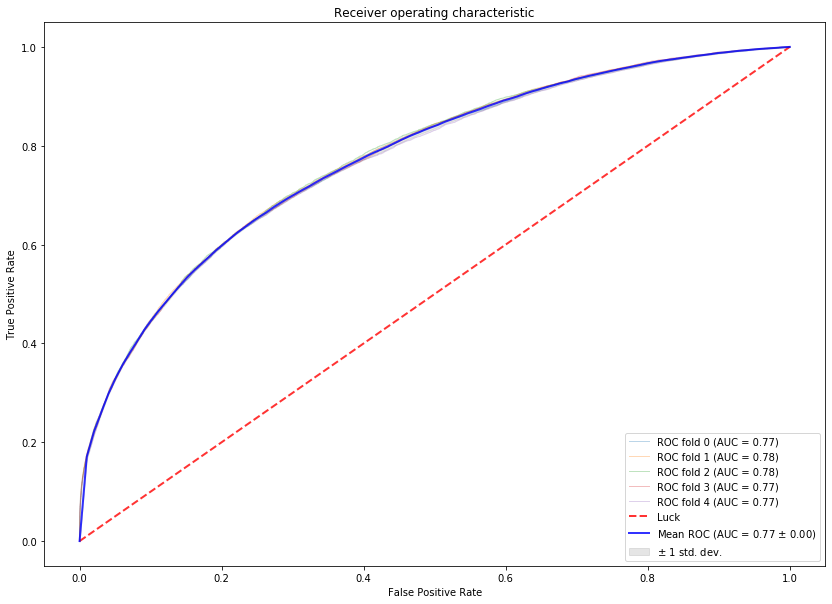

,AUC Train,AUC Test
0,0.848433,0.773430
1,0.865864,0.776200
2,0.845102,0.776511
3,0.844092,0.774476
4,0.849949,0.770785


In [105]:
plot_roc_curve(fprs, tprs)
pd.DataFrame(scores, columns=['AUC Train', 'AUC Test'])

In [111]:
model = lgbm.LGBMClassifier( 
    boosting_type="gbdt",
    is_unbalance=True, 
    num_leaves=60, 
    metric='None',
    feature_fraction=0.5,   
    subsample=0.6,
    learning_rate=0.01,
    n_estimators=3000
)

model.fit(X_train,
      y_train,
      categorical_feature= Cat_col,
      eval_set=[(X_test, y_test)], 
      feature_name = X_train.columns.tolist(),
      eval_metric ='auc',
      early_stopping_rounds=100)




[1]	valid_0's auc: 0.67028
Training until validation scores don't improve for 100 rounds
[2]	valid_0's auc: 0.690549
[3]	valid_0's auc: 0.707018
[4]	valid_0's auc: 0.733295
[5]	valid_0's auc: 0.733064
[6]	valid_0's auc: 0.73758
[7]	valid_0's auc: 0.741012
[8]	valid_0's auc: 0.741216
[9]	valid_0's auc: 0.745777
[10]	valid_0's auc: 0.746246
[11]	valid_0's auc: 0.747256
[12]	valid_0's auc: 0.748995
[13]	valid_0's auc: 0.749653
[14]	valid_0's auc: 0.749627
[15]	valid_0's auc: 0.749936
[16]	valid_0's auc: 0.750043
[17]	valid_0's auc: 0.751226
[18]	valid_0's auc: 0.751052
[19]	valid_0's auc: 0.75065
[20]	valid_0's auc: 0.751052
[21]	valid_0's auc: 0.750983
[22]	valid_0's auc: 0.751463
[23]	valid_0's auc: 0.751634
[24]	valid_0's auc: 0.751357
[25]	valid_0's auc: 0.751609
[26]	valid_0's auc: 0.751602
[27]	valid_0's auc: 0.75156
[28]	valid_0's auc: 0.751443
[29]	valid_0's auc: 0.751528
[30]	valid_0's auc: 0.752143
[31]	valid_0's auc: 0.752085
[32]	valid_0's auc: 0.752155
[33]	valid_0's auc: 0.7

[283]	valid_0's auc: 0.764522
[284]	valid_0's auc: 0.76461
[285]	valid_0's auc: 0.764613
[286]	valid_0's auc: 0.764691
[287]	valid_0's auc: 0.764704
[288]	valid_0's auc: 0.764739
[289]	valid_0's auc: 0.764824
[290]	valid_0's auc: 0.764842
[291]	valid_0's auc: 0.764901
[292]	valid_0's auc: 0.764948
[293]	valid_0's auc: 0.765009
[294]	valid_0's auc: 0.76503
[295]	valid_0's auc: 0.765046
[296]	valid_0's auc: 0.765081
[297]	valid_0's auc: 0.765124
[298]	valid_0's auc: 0.765169
[299]	valid_0's auc: 0.765189
[300]	valid_0's auc: 0.765238
[301]	valid_0's auc: 0.765298
[302]	valid_0's auc: 0.765349
[303]	valid_0's auc: 0.765351
[304]	valid_0's auc: 0.765402
[305]	valid_0's auc: 0.765446
[306]	valid_0's auc: 0.765465
[307]	valid_0's auc: 0.765534
[308]	valid_0's auc: 0.765583
[309]	valid_0's auc: 0.765601
[310]	valid_0's auc: 0.76562
[311]	valid_0's auc: 0.765674
[312]	valid_0's auc: 0.76567
[313]	valid_0's auc: 0.765695
[314]	valid_0's auc: 0.765733
[315]	valid_0's auc: 0.765768
[316]	valid_0'

[558]	valid_0's auc: 0.770696
[559]	valid_0's auc: 0.770701
[560]	valid_0's auc: 0.770701
[561]	valid_0's auc: 0.77071
[562]	valid_0's auc: 0.770713
[563]	valid_0's auc: 0.770728
[564]	valid_0's auc: 0.770741
[565]	valid_0's auc: 0.77075
[566]	valid_0's auc: 0.770766
[567]	valid_0's auc: 0.770779
[568]	valid_0's auc: 0.770784
[569]	valid_0's auc: 0.770795
[570]	valid_0's auc: 0.770812
[571]	valid_0's auc: 0.770815
[572]	valid_0's auc: 0.770828
[573]	valid_0's auc: 0.770855
[574]	valid_0's auc: 0.770883
[575]	valid_0's auc: 0.770894
[576]	valid_0's auc: 0.770887
[577]	valid_0's auc: 0.770885
[578]	valid_0's auc: 0.770893
[579]	valid_0's auc: 0.770926
[580]	valid_0's auc: 0.770932
[581]	valid_0's auc: 0.770975
[582]	valid_0's auc: 0.770989
[583]	valid_0's auc: 0.771002
[584]	valid_0's auc: 0.77103
[585]	valid_0's auc: 0.771044
[586]	valid_0's auc: 0.771053
[587]	valid_0's auc: 0.771069
[588]	valid_0's auc: 0.77109
[589]	valid_0's auc: 0.771089
[590]	valid_0's auc: 0.771083
[591]	valid_0'

[839]	valid_0's auc: 0.773934
[840]	valid_0's auc: 0.77396
[841]	valid_0's auc: 0.773956
[842]	valid_0's auc: 0.773974
[843]	valid_0's auc: 0.773973
[844]	valid_0's auc: 0.773986
[845]	valid_0's auc: 0.774001
[846]	valid_0's auc: 0.774009
[847]	valid_0's auc: 0.774004
[848]	valid_0's auc: 0.774024
[849]	valid_0's auc: 0.774032
[850]	valid_0's auc: 0.774036
[851]	valid_0's auc: 0.774048
[852]	valid_0's auc: 0.774049
[853]	valid_0's auc: 0.774055
[854]	valid_0's auc: 0.774058
[855]	valid_0's auc: 0.774069
[856]	valid_0's auc: 0.77408
[857]	valid_0's auc: 0.7741
[858]	valid_0's auc: 0.774106
[859]	valid_0's auc: 0.774125
[860]	valid_0's auc: 0.774146
[861]	valid_0's auc: 0.774162
[862]	valid_0's auc: 0.774165
[863]	valid_0's auc: 0.774181
[864]	valid_0's auc: 0.774197
[865]	valid_0's auc: 0.774207
[866]	valid_0's auc: 0.774205
[867]	valid_0's auc: 0.774222
[868]	valid_0's auc: 0.774233
[869]	valid_0's auc: 0.774232
[870]	valid_0's auc: 0.774249
[871]	valid_0's auc: 0.774252
[872]	valid_0'

[1112]	valid_0's auc: 0.775662
[1113]	valid_0's auc: 0.775666
[1114]	valid_0's auc: 0.775657
[1115]	valid_0's auc: 0.775666
[1116]	valid_0's auc: 0.775676
[1117]	valid_0's auc: 0.775682
[1118]	valid_0's auc: 0.775684
[1119]	valid_0's auc: 0.775689
[1120]	valid_0's auc: 0.775696
[1121]	valid_0's auc: 0.775696
[1122]	valid_0's auc: 0.775702
[1123]	valid_0's auc: 0.775708
[1124]	valid_0's auc: 0.775709
[1125]	valid_0's auc: 0.77573
[1126]	valid_0's auc: 0.775736
[1127]	valid_0's auc: 0.775738
[1128]	valid_0's auc: 0.775747
[1129]	valid_0's auc: 0.775754
[1130]	valid_0's auc: 0.775749
[1131]	valid_0's auc: 0.775767
[1132]	valid_0's auc: 0.775769
[1133]	valid_0's auc: 0.775772
[1134]	valid_0's auc: 0.775773
[1135]	valid_0's auc: 0.775765
[1136]	valid_0's auc: 0.775772
[1137]	valid_0's auc: 0.775771
[1138]	valid_0's auc: 0.775785
[1139]	valid_0's auc: 0.775786
[1140]	valid_0's auc: 0.775786
[1141]	valid_0's auc: 0.775798
[1142]	valid_0's auc: 0.775815
[1143]	valid_0's auc: 0.77582
[1144]	val

[1383]	valid_0's auc: 0.776637
[1384]	valid_0's auc: 0.776642
[1385]	valid_0's auc: 0.776643
[1386]	valid_0's auc: 0.776647
[1387]	valid_0's auc: 0.776657
[1388]	valid_0's auc: 0.776659
[1389]	valid_0's auc: 0.776662
[1390]	valid_0's auc: 0.776661
[1391]	valid_0's auc: 0.776662
[1392]	valid_0's auc: 0.776674
[1393]	valid_0's auc: 0.776677
[1394]	valid_0's auc: 0.776679
[1395]	valid_0's auc: 0.776684
[1396]	valid_0's auc: 0.776693
[1397]	valid_0's auc: 0.776688
[1398]	valid_0's auc: 0.776684
[1399]	valid_0's auc: 0.776703
[1400]	valid_0's auc: 0.776706
[1401]	valid_0's auc: 0.776707
[1402]	valid_0's auc: 0.776703
[1403]	valid_0's auc: 0.776702
[1404]	valid_0's auc: 0.776711
[1405]	valid_0's auc: 0.776715
[1406]	valid_0's auc: 0.776723
[1407]	valid_0's auc: 0.776731
[1408]	valid_0's auc: 0.776738
[1409]	valid_0's auc: 0.77674
[1410]	valid_0's auc: 0.776752
[1411]	valid_0's auc: 0.776753
[1412]	valid_0's auc: 0.776759
[1413]	valid_0's auc: 0.776762
[1414]	valid_0's auc: 0.776762
[1415]	va

[1656]	valid_0's auc: 0.777127
[1657]	valid_0's auc: 0.777124
[1658]	valid_0's auc: 0.777131
[1659]	valid_0's auc: 0.777131
[1660]	valid_0's auc: 0.777128
[1661]	valid_0's auc: 0.777133
[1662]	valid_0's auc: 0.777134
[1663]	valid_0's auc: 0.777134
[1664]	valid_0's auc: 0.777143
[1665]	valid_0's auc: 0.777144
[1666]	valid_0's auc: 0.777148
[1667]	valid_0's auc: 0.77715
[1668]	valid_0's auc: 0.777154
[1669]	valid_0's auc: 0.777158
[1670]	valid_0's auc: 0.777159
[1671]	valid_0's auc: 0.777156
[1672]	valid_0's auc: 0.777157
[1673]	valid_0's auc: 0.777157
[1674]	valid_0's auc: 0.777156
[1675]	valid_0's auc: 0.777152
[1676]	valid_0's auc: 0.777157
[1677]	valid_0's auc: 0.777158
[1678]	valid_0's auc: 0.777158
[1679]	valid_0's auc: 0.777156
[1680]	valid_0's auc: 0.777161
[1681]	valid_0's auc: 0.777154
[1682]	valid_0's auc: 0.777152
[1683]	valid_0's auc: 0.777148
[1684]	valid_0's auc: 0.777149
[1685]	valid_0's auc: 0.777147
[1686]	valid_0's auc: 0.777151
[1687]	valid_0's auc: 0.777146
[1688]	va

[1929]	valid_0's auc: 0.777378
[1930]	valid_0's auc: 0.777381
[1931]	valid_0's auc: 0.777379
[1932]	valid_0's auc: 0.777381
[1933]	valid_0's auc: 0.777382
[1934]	valid_0's auc: 0.777387
[1935]	valid_0's auc: 0.777387
[1936]	valid_0's auc: 0.777385
[1937]	valid_0's auc: 0.77738
[1938]	valid_0's auc: 0.777384
[1939]	valid_0's auc: 0.777383
[1940]	valid_0's auc: 0.777381
[1941]	valid_0's auc: 0.777381
[1942]	valid_0's auc: 0.777379
[1943]	valid_0's auc: 0.777385
[1944]	valid_0's auc: 0.777386
[1945]	valid_0's auc: 0.777381
[1946]	valid_0's auc: 0.777384
[1947]	valid_0's auc: 0.777388
[1948]	valid_0's auc: 0.777387
[1949]	valid_0's auc: 0.77739
[1950]	valid_0's auc: 0.777397
[1951]	valid_0's auc: 0.777397
[1952]	valid_0's auc: 0.777395
[1953]	valid_0's auc: 0.777392
[1954]	valid_0's auc: 0.777394
[1955]	valid_0's auc: 0.777392
[1956]	valid_0's auc: 0.777392
[1957]	valid_0's auc: 0.777398
[1958]	valid_0's auc: 0.777395
[1959]	valid_0's auc: 0.777401
[1960]	valid_0's auc: 0.777405
[1961]	val

[2198]	valid_0's auc: 0.77764
[2199]	valid_0's auc: 0.777633
[2200]	valid_0's auc: 0.77764
[2201]	valid_0's auc: 0.77764
[2202]	valid_0's auc: 0.777637
[2203]	valid_0's auc: 0.777638
[2204]	valid_0's auc: 0.777638
[2205]	valid_0's auc: 0.777634
[2206]	valid_0's auc: 0.777629
[2207]	valid_0's auc: 0.777624
[2208]	valid_0's auc: 0.777628
[2209]	valid_0's auc: 0.777623
[2210]	valid_0's auc: 0.777621
[2211]	valid_0's auc: 0.777618
[2212]	valid_0's auc: 0.777617
[2213]	valid_0's auc: 0.777617
[2214]	valid_0's auc: 0.777618
[2215]	valid_0's auc: 0.777619
[2216]	valid_0's auc: 0.777625
[2217]	valid_0's auc: 0.777629
[2218]	valid_0's auc: 0.777632
[2219]	valid_0's auc: 0.777634
[2220]	valid_0's auc: 0.777644
[2221]	valid_0's auc: 0.777637
[2222]	valid_0's auc: 0.777636
[2223]	valid_0's auc: 0.77764
[2224]	valid_0's auc: 0.777641
[2225]	valid_0's auc: 0.77764
[2226]	valid_0's auc: 0.777643
[2227]	valid_0's auc: 0.77764
[2228]	valid_0's auc: 0.777631
[2229]	valid_0's auc: 0.777627
[2230]	valid_0

LGBMClassifier(feature_fraction=0.5, is_unbalance=True, learning_rate=0.01,
               metric='None', n_estimators=3000, num_leaves=60, subsample=0.6)

In [112]:



y_predict = model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_predict)
print(f" AUC Score : {auc(fpr,tpr)}")
print(f" Log Loss Score : {log_loss(y_test, y_predict)}")

 AUC Score : 0.7777138688902063
 Log Loss Score : 0.5454986542734611


In [107]:
accuracy_score(y_test,model.predict(X_test))

0.7245310970609243

In [113]:
d = pd.DataFrame(y_test)
d.columns = ['target']
d['prob'] = model.predict_proba(X_test)[:,1]


def ks(data=None,target=None, prob=None):
    data['target0'] = 1 - data[target]
    data['bucket'] = pd.qcut(data[prob], 10)
    grouped = data.groupby('bucket', as_index = False)
    kstable = pd.DataFrame()
    kstable['min_prob'] = grouped.min()[prob]
    kstable['max_prob'] = grouped.max()[prob]
    kstable['events']   = grouped.sum()[target]
    kstable['nonevents'] = grouped.sum()['target0']
    kstable = kstable.sort_values(by="min_prob", ascending=False).reset_index(drop = True)
    kstable['event_rate'] = (kstable.events / data[target].sum()).apply('{0:.2%}'.format)
    kstable['nonevent_rate'] = (kstable.nonevents / data['target0'].sum()).apply('{0:.2%}'.format)
    kstable['cum_eventrate']=(kstable.events / data[target].sum()).cumsum()
    kstable['cum_noneventrate']=(kstable.nonevents / data['target0'].sum()).cumsum()
    kstable['KS'] = np.round(kstable['cum_eventrate']-kstable['cum_noneventrate'], 3) * 100

    #Formating
    kstable['cum_eventrate']= kstable['cum_eventrate'].apply('{0:.2%}'.format)
    kstable['cum_noneventrate']= kstable['cum_noneventrate'].apply('{0:.2%}'.format)
    kstable.index = range(1,11)
    kstable.index.rename('Decile', inplace=True)
    pd.set_option('display.max_columns', 9)
    
    #Display KS
    from colorama import Fore
    print(Fore.RED + "KS is " + str(max(kstable['KS']))+"%"+ " at decile " + str((kstable.index[kstable['KS']==max(kstable['KS'])][0])))
    return(kstable)

In [114]:
ks(d,target='target',prob='prob')

KS is 40.6% at decile 4


,min_prob,max_prob,events,nonevents,event_rate,nonevent_rate,cum_eventrate,cum_noneventrate,KS
Decile,,,,,,,,,
1,0.760529,0.998575,2923,857,27.82%,3.14%,27.82%,3.14%,24.7
2,0.641024,0.760496,1874,1906,17.84%,6.98%,45.66%,10.12%,35.5
3,0.546083,0.641010,1388,2392,13.21%,8.76%,58.87%,18.89%,40.0
4,0.469086,0.546029,1101,2679,10.48%,9.82%,69.34%,28.70%,40.6
5,0.404168,0.469050,876,2904,8.34%,10.64%,77.68%,39.34%,38.3
6,0.348834,0.404155,722,3058,6.87%,11.20%,84.55%,50.55%,34.0
7,0.294624,0.348826,615,3165,5.85%,11.60%,90.41%,62.14%,28.3
8,0.231812,0.294612,498,3282,4.74%,12.02%,95.15%,74.17%,21.0
9,0.157266,0.231809,308,3472,2.93%,12.72%,98.08%,86.89%,11.2
